In [3]:
import glob, os, sys
import numpy as np
import csv
import cv2
import pickle
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer
import tensorflow as tf
import PIL
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Dropout, Dense, Softmax)
from tensorflow.keras.applications import mobilenet as _mobilenet
import numpy as np
from PIL import Image
import networkx as nx
from IPython.display import Image as iImage
from IPython.display import display
import math
import matplotlib.pyplot as plt
import ebooklib
from ebooklib import epub
import random
import re
import os
import nltk
from nltk.corpus import words
import gensim
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
from nltk.corpus import words, stopwords, names
from sklearn.decomposition import PCA
import scipy.spatial
from matplotlib import cm
import matplotlib.image as mpimg
import pandas as pd
import jieba
from sklearn.metrics.pairwise import linear_kernel
from nltk import pos_tag
from sklearn.metrics.pairwise import cosine_similarity
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
import sklearn
from matplotlib.colors import LinearSegmentedColormap


In [4]:
%cd D:\rc11\collection\python

D:\rc11\collection\python


# Train SOM

### photo to photo

In [5]:
# Return the (g,h) index of the BMU in the grid
def find_BMU(SOM,x):
    distSq = (np.square(SOM - x)).sum(axis=2)
    return np.unravel_index(np.argmin(distSq, axis=None), distSq.shape)

# Update the weights of the SOM cells when given a single training example
# and the model parameters along with BMU coordinates as a tuple
def update_weights(SOM, train_ex, learn_rate, radius_sq,
                   BMU_coord, step=3):
    g, h = BMU_coord
    #if radius is close to zero then only BMU is changed
    if radius_sq < 1e-3:
        SOM[g,h,:] += learn_rate * (train_ex - SOM[g,h,:])
        return SOM
    # Change all cells in a small neighborhood of BMU
    for i in range(max(0, g-step), min(SOM.shape[0], g+step)):
        for j in range(max(0, h-step), min(SOM.shape[1], h+step)):
            dist_sq = np.square(i - g) + np.square(j - h)
            dist_func = np.exp(-dist_sq / 2 / radius_sq)
            SOM[i,j,:] += learn_rate * dist_func * (train_ex - SOM[i,j,:])
    return SOM

# Main routine for training an SOM. It requires an initialized SOM grid
# or a partially trained grid as parameter
def train_SOM(SOM, train_data, learn_rate = .1, radius_sq = 1,
             lr_decay = .1, radius_decay = .1, epochs = 10):
    learn_rate_0 = learn_rate
    radius_0 = radius_sq
    for epoch in np.arange(0, epochs):
        np.random.shuffle(train_data)
        for train_ex in train_data:
            g, h = find_BMU(SOM, train_ex)
            SOM = update_weights(SOM, train_ex,
                                 learn_rate, radius_sq, (g,h))
        # Update learning rate and radius
        learn_rate = learn_rate_0 * np.exp(-epoch * lr_decay)
        radius_sq = radius_0 * np.exp(-epoch * radius_decay)
    return SOM
import scipy
def calculateQE(SOM,data):
    sumSqDist = 0
    for d in data:
        g,h = find_BMU(SOM, d)
        v1 = SOM[g,h]
        v2 = d
        sumSqDist += scipy.spatial.distance.cdist([v1],[v2],'sqeuclidean')[0][0]
    QE = sumSqDist/len(data)
    return QE
    
# Return the (g,h) index of the BMU in the grid
def find_BMU_2(SOM,x):
    distSq = (np.square(SOM - x)).sum(axis=2)
    return np.unravel_index(np.argpartition(distSq, 2, axis=None)[2], distSq.shape)
    

def calculateTE(SOM, data):
    failed = 0
    for d in data:
        g1, h1 = find_BMU(SOM, d)
        g2, h2 = find_BMU_2(SOM, d)
        coord1 = np.array([g1, h1])
        coord2 = np.array([g2, h2])
        dist = euclidean(coord1, coord2)

        if dist > 1:
            failed += 1

    return failed / len(data)
    
def activate(train_data, SOM, p):
    normalP = normalise(train_data, p)
    activatedSOM = np.array([[euclidean(normalP, c) for c in r] for r in SOM])
    normalisedActivatedSOM = normalise(activatedSOM, activatedSOM)
    activatedSOM = (normalisedActivatedSOM -1)*(-1)
    return activatedSOM

def normalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    normalised_p = (p-min_d)/(max_d - min_d)
    return normalised_p

def denormalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    denormalised_p = p * (max_d - min_d) + min_d
    return denormalised_p

def euclidean(a, b):
    return np.linalg.norm(a-b)

def u_matrix(lattice):

    """Builds a U-matrix on top of the trained lattice.

        Parameters
        ---
        lattice : list

            The SOM generated lattice

        Returns
        ---
        The lattice of the shape (R,C):

        R - number of rows; C - number of columns;
        """
    X, Y, Z = lattice.shape
    u_values = np.empty((X,Y), dtype=np.float64) #初始化空矩阵存储计算出的距离值。矩阵大小与SOM的行数和列数相同

    for y in range(Y):
        for x in range(X):
            current = lattice[x,y]
            dist = 0
            num_neigh = 0
            #对每个节点，计算其与其周围的欧氏距离（上下左右及对角线）
            # left
            if x-1 >= 0:
                #middle
                vec = lattice[x-1,y]
                dist += euclidean(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    #sup
                    vec = lattice[x-1, y-1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
                if y + 1 < Y:
                    # down
                    vec = lattice[x-1,y+1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
            # middle
            if y - 1 >= 0:
                # up
                vec = lattice[x,y-1]
                dist += euclidean(current, vec)
                num_neigh += 1
            # down
            if y + 1 < Y:
                vec = lattice[x,y+1]
                dist += euclidean(current, vec)
                num_neigh += 1
            # right
            if x + 1 < X:
                # middle
                vec = lattice[x+1,y]
                dist += euclidean(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    #up
                    vec = lattice[x+1,y-1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
                if y + 1 < lattice.shape[1]:
                    # down
                    vec = lattice[x+1,y+1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
            u_values[x,y] = dist / num_neigh #计算与邻居节点的平均距离
    u_values = (u_values - 1) * -1
    return u_values

In [6]:
def load_image(img_file, target_size=(224,224)):
    X = np.zeros((1, *target_size, 3))
    X[0, ] = np.asarray(tf.keras.preprocessing.image.load_img(
        img_file, 
        target_size=target_size)
    )
    X = tf.keras.applications.mobilenet.preprocess_input(X)
    return X

def ensure_folder_exists(folder):
    if not os.path.exists(folder):
        os.makedirs(folder)

model = tf.keras.applications.mobilenet.MobileNet(
# The 3 is the three dimensions of the input: r,g,b.
  input_shape=(224, 224, 3), 
  include_top=False, 
  pooling='avg'
)

In [7]:
model.save_weights('database03_video')
model.load_weights('database03_video')

In [8]:
def processImage(imagePath, model):
    im = load_image(imagePath)
    f = model.predict(im)[0]
    return f

In [12]:
def extract_images_from_folders(main_folder_path):
    all_image_paths = []
    for root, dirs, files in os.walk(main_folder_path):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif')): 
                file_path = os.path.join(root, file)
                all_image_paths.append(file_path)
    return all_image_paths
main_folder_path = r'D:\rc11\collection\images\garden'

all_image_paths = extract_images_from_folders(main_folder_path)
print("Total images found:", len(all_image_paths))

Total images found: 1000


In [13]:
all_image_paths[0]

'D:\\rc11\\collection\\images\\garden\\image1.jpg'

In [14]:
def read_csv_files(folder_path):
    files_list = []
    global_index = 0  

    for index, filename in enumerate(os.listdir(folder_path)):
        if filename.endswith('.csv'):
            file_path = os.path.join(folder_path, filename)

            with open(file_path, 'r', encoding='utf-8') as csvfile:
                reader = csv.DictReader(csvfile)

                for row_num, row in enumerate(reader, start=1):
                    file_info = {
                        'nr': global_index,  # 全局索引
                        'filename': row.get('Filename', ''),
                        'content': row.get('Text', ''),
                        'file_index': index,  # 文件索引
                        'row_index': row_num  # 当前文件内的行号
                    }
                    files_list.append(file_info)
                    global_index += 1

    return files_list

In [15]:
folder_path2 = r'D:\rc11\collection\python\database02_photo\text1'
texts2 = read_csv_files(folder_path2)

In [16]:
SPFiles = all_image_paths[:2400]

In [17]:
features5 = []
SPFiles_filtered = []

for path in SPFiles:
    try:
        feature = processImage(path, model)
        features5.append(feature)
        SPFiles_filtered.append(path)
    except Exception as e:
        print(f"Error processing {path}: {e}")

if len(SPFiles_filtered) != len(features5):
    raise ValueError("Filtered SPFiles and features5 must be the same length.")

featureImagePairs5 = [
    {'image': spfile, 'feature': feature}
    for spfile, feature in zip(SPFiles_filtered, features5)
]

print(f"Total pairs created: {len(featureImagePairs5)}")

1/1 [==============================] - 0s 102ms/step


1/1 [==============================] - 0s 104ms/step


1/1 [==============================] - 0s 107ms/step


1/1 [==============================] - 0s 108ms/step
Total pairs created: 1000


In [20]:
import pickle

with open('Database02_image.pkl', 'wb') as pickle_file:
    pickle.dump(featureImagePairs5, pickle_file)

print("Results have been saved to feature_image_pairs.pkl")

Results have been saved to feature_image_pairs.pkl


In [21]:
import pickle

# 读取 `pickle` 文件
with open('Database02_image.pkl', 'rb') as pickle_file:
    featureImagePairs5 = pickle.load(pickle_file)

In [22]:
featureImagePairs5[0]

{'image': 'D:\\rc11\\collection\\images\\garden\\image1.jpg',
 'feature': array([0.68595666, 0.03167801, 1.441234  , ..., 0.61087126, 0.        ,
        0.        ], dtype=float32)}

In [23]:
import os
def extract_filename(image_path):
    return os.path.basename(image_path)
texts2_dict = {item['filename']: item for item in texts2}
combined_data = []

for item in featureImagePairs5:
    image_filename = extract_filename(item['image'])

    if image_filename in texts2_dict:
        combined_item = {**item, **texts2_dict[image_filename]}  
        combined_data.append(combined_item)

print(f"Total combined items: {len(combined_data)}")

Total combined items: 1000


In [24]:
featureImagePairs6 = []

for data in combined_data:
    featureText = {}
    featureText['filename'] = data['filename']
    featureText['path'] = data['image']
    featureText['content'] = data['content']
    featureText['file_index'] = data['file_index']
    featureText['feature'] = data['feature']
    
    featureImagePairs6.append(featureText)

print(len(featureImagePairs6))

1000


In [25]:
import pickle
output_file_path = "featureImagePairs6.pkl"
with open(output_file_path, "wb") as f:
    pickle.dump(featureImagePairs6, f)
print(f"Feature-image pairs saved to {output_file_path}")

Feature-image pairs saved to featureImagePairs6.pkl


In [26]:
import pickle
input_file_path = "featureImagePairs6.pkl"
with open(input_file_path, "rb") as f:
    featureImagePairs6 = pickle.load(f)

In [27]:
featureImagePairs6[0]

{'filename': 'image1.jpg',
 'path': 'D:\\rc11\\collection\\images\\garden\\image1.jpg',
 'content': 'The image features a garden with a variety of colorful flowers and plants. The garden is surrounded by lush green grass, creating a beautiful and serene atmosphere.\n\nThere are multiple bushes and trees in the garden, with some tall and skinny trees and others more bushy. The garden is surrounded by various types of flowers, including purple and pink ones,',
 'file_index': 0,
 'feature': array([0.68595666, 0.03167801, 1.441234  , ..., 0.61087126, 0.        ,
        0.        ], dtype=float32)}

In [28]:
colors = [
    (0, "#9ca5c1"),  # purple
    (0.4, "#e1a2ee"),  # purple
    (0.8, "#eedba2"),  # yellow
    (1, "#eeeea2")  # yellow
]

cmap = LinearSegmentedColormap.from_list('custom_cmap', colors)

In [30]:
# Dimensions of the SOM grid
m = 10
n = 10
train_data5 = [pair['feature'] for pair in featureImagePairs6]
n_train_data5 = normalise(train_data5, train_data5)

0
1
2
3


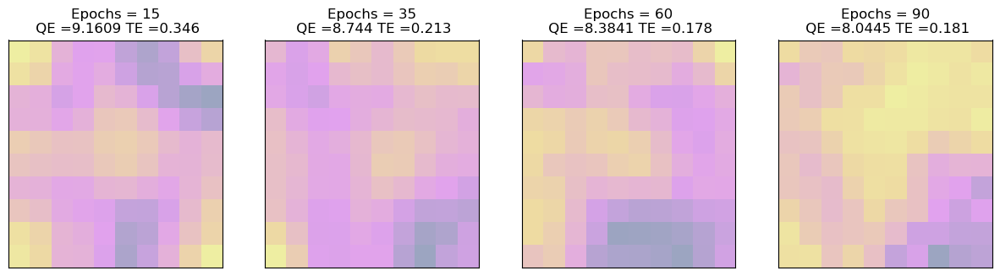

In [31]:
from matplotlib.colors import LinearSegmentedColormap
total_epochs = 0
SOMS5 = []
vector_size = 1024 
fig, ax = plt.subplots(
    nrows=1, ncols=4, figsize=(15, 3.5), 
    subplot_kw=dict(xticks=[], yticks=[]))

for epochs, i in zip([15, 20, 25, 30], range(0,4)):
    print(i)
    total_epochs += epochs
    rand = np.random.RandomState(0)
    SOM5 = rand.uniform(0,1,(m,n,vector_size))
    SOM5 = train_SOM(SOM5, n_train_data5, learn_rate = .5, radius_sq = 7, epochs = epochs)
    SOMS5.append(SOM5)
    QE = round(calculateQE(SOM5, n_train_data5), 4)
    TE = round(calculateTE(SOM5, n_train_data5), 4)
    
    ax[i].imshow(u_matrix(SOM5),cmap=cmap,aspect='auto')
    ax[i].title.set_text('Epochs = ' + str(total_epochs) + '\n QE =' + str(QE) + ' TE =' + str(TE))

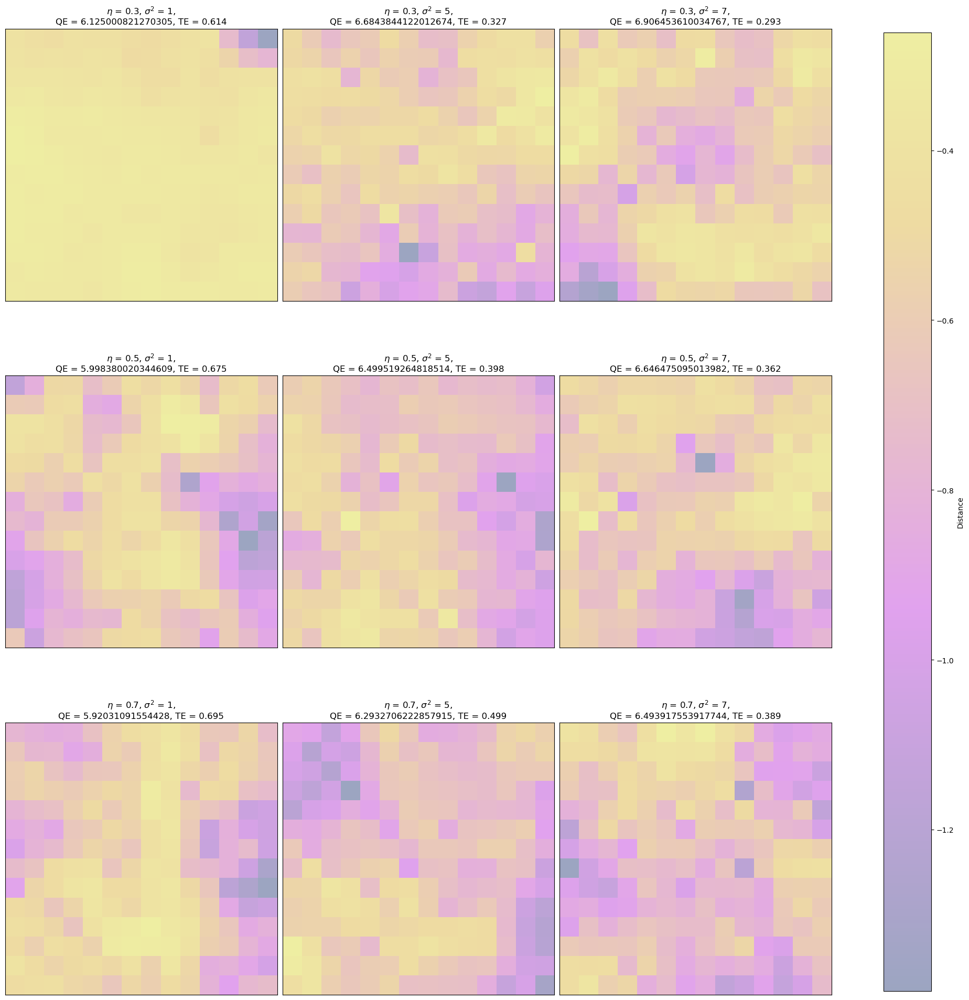

In [119]:
soms5 = []
learn_rates = [0.3, 0.5, 0.7]
radiuses = [1, 5, 7]
m, n = 14, 14
vector_size = 1024

for learn_rate in learn_rates:
    for radius in radiuses:
        rand = np.random.RandomState(0)
        SOM5 = rand.uniform(0, 1, (m, n, vector_size))
        SOM5 = train_SOM(SOM5, n_train_data5, epochs=50, learn_rate=learn_rate, radius_sq=radius)
        soms5.append(SOM5)

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 20), subplot_kw=dict(xticks=[], yticks=[]))
param_combinations = [(lr, rsq) for lr in learn_rates for rsq in radiuses]

for s, ax, (learn_rate, radius_sq) in zip(soms5, axes.flat, param_combinations):
    u_matrix_values = u_matrix(s)
    im = ax.imshow(u_matrix_values, cmap=cmap)
    QE = round(calculateQE(s, n_train_data5), 250)
    TE = round(calculateTE(s, n_train_data5), 250)
    ax.set_title(f'$\eta$ = {learn_rate}, $\sigma^2$ = {radius_sq},\nQE = {QE}, TE = {TE}')

plt.tight_layout()
cbar = plt.colorbar(im, ax=axes.ravel().tolist(), shrink=0.95)
cbar.set_label('Distance')
plt.show()

In [120]:
SOM5 = soms5[4]

In [121]:
with open('Database02_ImageSOM.pkl', 'wb') as f:
    pickle.dump(SOM5, f)

In [122]:
import pickle
with open('Database02_ImageSOM.pkl', 'rb') as f:
    SOM5= pickle.load(f)

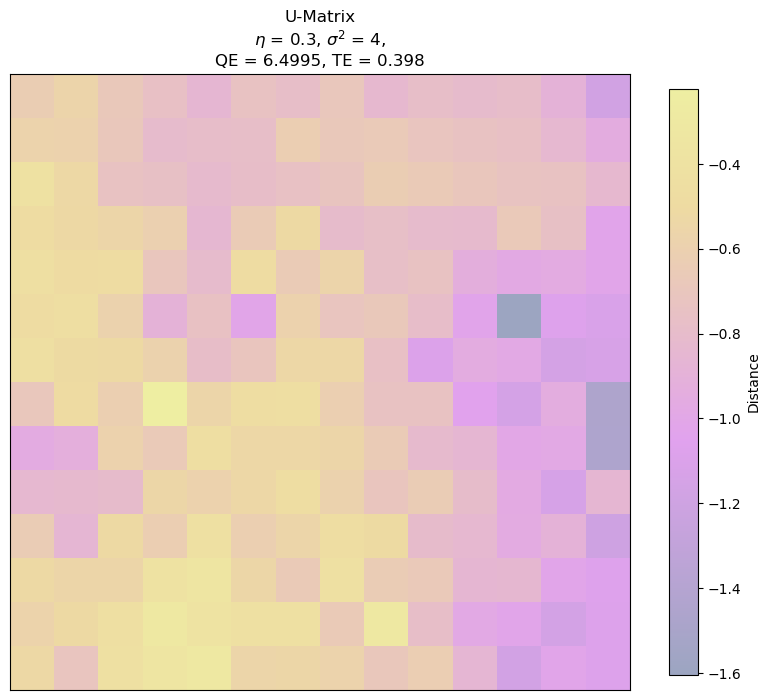

In [123]:
u_matrix_values = u_matrix(SOM5)
QE = round(calculateQE(SOM5, n_train_data5), 4)
TE = round(calculateTE(SOM5, n_train_data5), 4)

plt.figure(figsize=(10, 8))
im = plt.imshow(u_matrix_values, cmap=cmap, aspect='auto')
plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
plt.colorbar(im, shrink=0.95, label='Distance')
plt.xticks([])
plt.yticks([])
plt.show()

In [124]:
SOMimages = []
for i in range(len(SOM5)):
    row5 = []
    for j in range(len(SOM5[0])):
        row5.append([])
    SOMimages.append(row5)

In [125]:
for fi in featureImagePairs5:
    g,h = find_BMU(SOM5, normalise(train_data5, fi['feature']))
    SOMimages[g][h].append(fi)

In [126]:
[[len(c) for c in r] for r in SOMimages]

[[9, 9, 7, 8, 6, 5, 8, 7, 8, 4, 6, 6, 4, 8],
 [9, 5, 9, 5, 3, 8, 3, 4, 5, 5, 6, 4, 5, 3],
 [9, 3, 6, 4, 2, 4, 9, 3, 4, 9, 4, 4, 6, 4],
 [7, 4, 6, 2, 9, 6, 2, 6, 4, 5, 4, 8, 2, 7],
 [4, 9, 5, 7, 4, 1, 7, 3, 5, 5, 5, 4, 1, 7],
 [10, 2, 5, 6, 3, 6, 3, 6, 2, 4, 3, 4, 2, 5],
 [9, 7, 5, 6, 8, 4, 4, 5, 4, 7, 2, 5, 4, 5],
 [6, 1, 7, 0, 5, 8, 6, 6, 5, 3, 3, 7, 2, 6],
 [6, 4, 5, 7, 6, 6, 6, 4, 3, 7, 5, 3, 1, 5],
 [6, 6, 4, 5, 7, 3, 4, 6, 5, 2, 4, 3, 4, 1],
 [9, 5, 2, 7, 2, 6, 7, 2, 3, 6, 6, 6, 2, 7],
 [6, 6, 4, 6, 4, 6, 8, 2, 8, 3, 2, 2, 3, 4],
 [11, 5, 5, 6, 8, 4, 1, 5, 0, 5, 3, 4, 3, 6],
 [11, 4, 9, 9, 9, 6, 8, 3, 8, 4, 6, 5, 4, 6]]

In [127]:
def distance_between(a, b):
    a = np.asarray(a, dtype=np.float64)
    b = np.asarray(b, dtype=np.float64)
    return np.linalg.norm(a - b)

In [128]:
def find_closest_image_index(distance):
    closest_index = 0
    distance_closest = distance[0]

    for index in range(1, len(distance)):
        if distance[index] < distance_closest:
            distance_closest = distance[index]
            closest_index = index

    return closest_index

In [129]:
def get_closest_image(a,b):
    cell = SOM5[a][b]
    distance = [distance_between(cell, i['feature']) for i in SOMimages[a][b]]
    closest_image_index=find_closest_image_index(distance)
    return closest_image_index

In [130]:
def img_reshape(img):
    img_path = os.path.join(main_folder_path, img)
    img = Image.open(img_path).convert('RGB')
    img = img.resize((100, 100))
    img = np.asarray(img)
    return img

In [142]:
from mpl_toolkits.axes_grid1 import ImageGrid
def generate_SOMimages_grid(SOMimages):
    imageGrid = []
    for g in range(len(SOMimages)):
        row = SOMimages[g]
        for h in range(len(row)):
            cell = row[h]
            if len(cell) > 0:
                closest_image_index=get_closest_image(g,h)
                imageGrid.append(cell[closest_image_index]['image'])
            else:
                imageGrid.append('white.png')
            
    img_arr = []
    for image in imageGrid:
        img_arr.append(img_reshape(image))
        
    fig = plt.figure(figsize=(20., 20.))
    grid = ImageGrid(fig, 111,
                     nrows_ncols=(14, 14),  # creates 2x2 grid of axes
                     axes_pad=0.1,  # pad between axes
                    ) 
    
    for ax, im in zip(grid, img_arr):
        ax.imshow(im)
        ax.axis('off')
    SOMimages_grid=plt.show()
    
    return SOMimages_grid

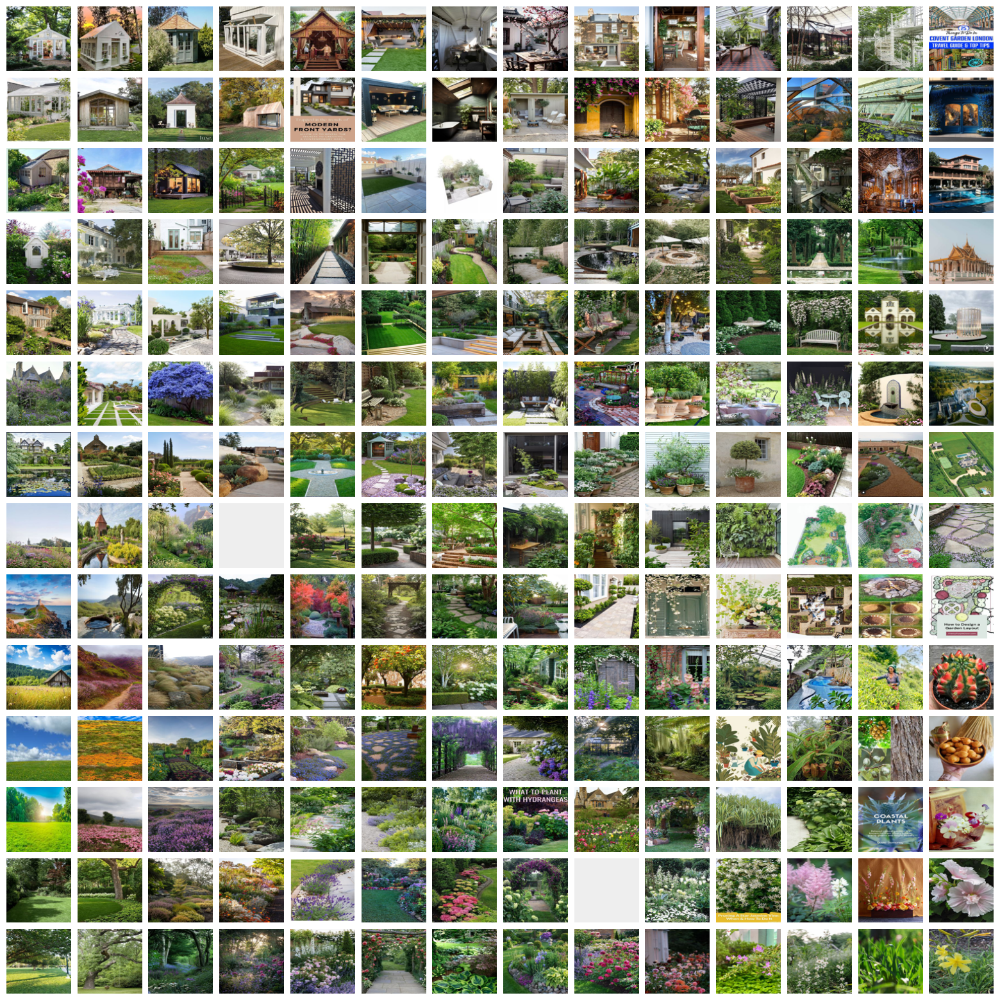

In [143]:
generate_SOMimages_grid(SOMimages)

In [144]:
video_picture_data_dict2 = [[[] for _ in range(len(SOM5[0]))] for _ in range(len(SOM5))]

# 遍历每个格子中的列表
for row in SOMimages:
    for cell in row:
        for item in cell:
            # 确保每个项是字典并且包含必要的键
            if not isinstance(item, dict) or 'feature' not in item or 'image' not in item:
                continue

            features = item['feature']
            path = item['image']

            # 查找 BMU 坐标
            g, h = find_BMU(SOM5, features)

            # 确保 BMU 坐标在范围内
            if 0 <= g < len(SOM5) and 0 <= h < len(SOM5[0]):
                video_picture_data_dict2[g][h].append({'features': features, 'image': path})
            else:
                print(f"Warning: Index out of range ({g}, {h}) for path: {path}")


In [145]:
def get_closest_image2(a,b):
  cell = SOM5[a][b]
  distance = [distance_between(cell, i['features']) for i in video_picture_data_dict2[a][b]]
  closest_image_index=find_closest_image_index(distance)
  return closest_image_index

In [146]:
def searchvideopicturesom5(query):
    result = []
    query_features = []
    path = query
    q_f = processImage(path, model)
    query_features.append(q_f)

    # 调试信息
    print(f"Query features shape: {np.array(query_features).shape}")
    activatedSOM = activate(n_train_data5, SOM5, query_features)

    # 检查 BMU 查找是否正常
    g, h = find_BMU(SOM5, query_features[0])
    print(f"BMU location: ({g}, {h})")

    # 显示 U-Matrix 结果
    plt.figure(figsize=(5, 4))
    im = plt.imshow(activatedSOM, cmap=cmap, aspect='auto')
    plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4}')
    plt.colorbar(im, shrink=0.95, label='Distance')
    plt.xticks([])
    plt.yticks([])
    plt.show()

    # 获取最近的图像索引
    closest_image_index = get_closest_image2(g, h)
    result.append(video_picture_data_dict2[g][h][closest_image_index]['image'])
    return result

In [147]:
def searchvideopicturesom5(query):
    result = []
    query_features = []
    path = query
    q_f = processImage(path, model)
    query_features.append(q_f)

    # 调试信息
    print(f"Query features shape: {np.array(query_features).shape}")
    activatedSOM = activate(n_train_data5, SOM5, query_features)

    # 检查 BMU 查找是否正常
    g, h = find_BMU(SOM5, query_features[0])
    print(f"BMU location: ({g}, {h})")

    # 显示 U-Matrix 结果
    plt.figure(figsize=(5, 4))
    im = plt.imshow(activatedSOM, cmap=cmap, aspect='auto')
    plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4}')
    plt.colorbar(im, shrink=0.95, label='Distance')
    plt.xticks([])
    plt.yticks([])
    plt.show()

    # 获取最近的图像索引
    closest_image_index = get_closest_image2(g, h)
    
    # 获取最近图像的路径和内容
    closest_image_info = video_picture_data_dict2[g][h][closest_image_index]
    
    for index, item in enumerate(featureImagePairs6):
        if item['path'] == closest_image_info['image']:
            result.append({'image': closest_image_info['image'], 
                           'path': item['path'], 
                           'content': item['content']})
            break
    
    return result



1/1 [==============================] - 0s 108ms/step
Query features shape: (1, 1024)
BMU location: (0, 7)


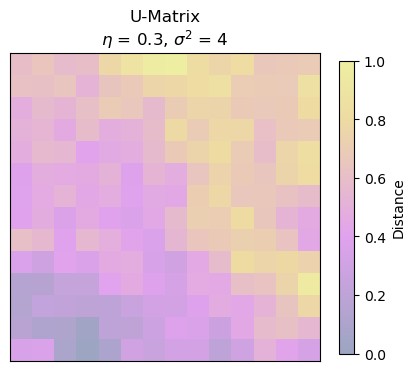

In [153]:
query = r'D:\rc11\collection\images\museum\52900762653_44466b92f6_z.jpg'
result5 = searchvideopicturesom5(query)

In [154]:
result5

[{'image': 'D:\\rc11\\collection\\images\\garden\\image691.jpg',
  'path': 'D:\\rc11\\collection\\images\\garden\\image691.jpg',
  'content': 'The image features a wooden dining table with a tea set on it, surrounded by chairs. The table is surrounded by several potted plants, creating a pleasant and inviting atmosphere. There are also vases and bowls on the table, adding to the aesthetic appeal of the scene. The setting appears to be a patio or outdoor area, perfect for enjoying a meal or'}]

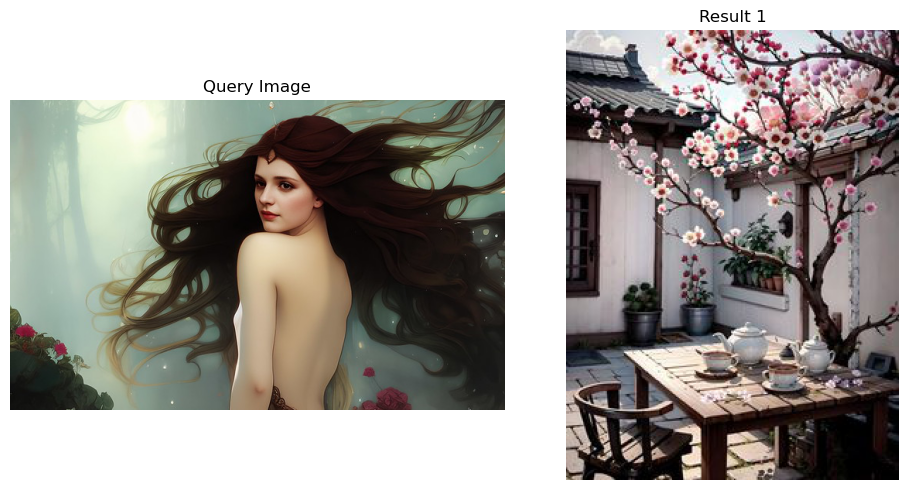

In [155]:
import matplotlib.pyplot as plt
from PIL import Image

def show_query_and_results(query_image_path, result_image_paths):
    image_paths = [query_image_path] + [item['image'] for item in result_image_paths]
    titles = ["Query Image"] + [f"Result {i+1}" for i in range(len(result_image_paths))]

    # 确定布局，按行数显示
    n_images = len(image_paths)
    fig, axes = plt.subplots(1, n_images, figsize=(5 * n_images, 5))

    if n_images == 1:
        axes = [axes]

    for ax, path, title in zip(axes, image_paths, titles):
        try:
            # 使用 PIL 加载图像
            image = Image.open(path)
            ax.imshow(image)
            ax.axis('off')
            ax.set_title(title)
        except Exception as e:
            ax.set_title(f"Error: {e}")
            ax.axis('off')

    plt.tight_layout()
    plt.show()

show_query_and_results(query, result5)


In [156]:
contents = [item['content'] for item in result5]

In [157]:
contents

['The image features a wooden dining table with a tea set on it, surrounded by chairs. The table is surrounded by several potted plants, creating a pleasant and inviting atmosphere. There are also vases and bowls on the table, adding to the aesthetic appeal of the scene. The setting appears to be a patio or outdoor area, perfect for enjoying a meal or']

### photo to txt

In [64]:
def calculateQE(SOM,data):
    sumSqDist = 0
    for d in data:
        g,h = find_BMU(SOM, d)
        v1 = SOM[g,h]
        v2 = d
        sumSqDist += scipy.spatial.distance.cdist([v1],[v2],'cosine')[0][0]
    QE = sumSqDist/len(data)
    return QE

def calculateTE(SOM, data):
        failed = 0
        for d in data:
            g1, h1 = find_BMU1(SOM, d)
            g2, h2 = find_BMU_2(SOM, d)
            dist = scipy.spatial.distance.cityblock([g1, h1], [g2, h2])
            if dist > 1:
                failed += 1
        return failed / len(data)

def find_BMU_2(SOM,x):
    somShape = SOM.shape
    simSOM = SOM.reshape((-1, len(x)))
    cos_sims = cosine_similarity([x], simSOM).reshape(somShape[:2])
    return np.unravel_index(np.argpartition(cos_sims, -2, axis=None)[-2], cos_sims.shape)

def normalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    normalised_p = (p-min_d)/(max_d - min_d)
    return normalised_p

def denormalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    denormalised_p = p * (max_d - min_d) + min_d
    return denormalised_p

def cosine(a,b):
    return cosine_similarity([a], [b])[0][0]

def u_matrix(lattice):
    X, Y, Z = lattice.shape
    u_values = np.empty((X, Y), dtype=np.float64)

    for y in range(Y):
        for x in range(X):
            current = lattice[x, y]
            dist = 0
            num_neigh = 0

            # 左侧邻居及对角线
            if x - 1 >= 0:
                vec = lattice[x - 1, y]
                dist += cosine(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    vec = lattice[x - 1, y - 1]
                    dist += cosine(current, vec)
                    num_neigh += 1
                if y + 1 < Y:
                    vec = lattice[x - 1, y + 1]
                    dist += cosine(current, vec)
                    num_neigh += 1

            # 上方和下方邻居
            if y - 1 >= 0:
                vec = lattice[x, y - 1]
                dist += cosine(current, vec)
                num_neigh += 1
            if y + 1 < Y:
                vec = lattice[x, y + 1]
                dist += cosine(current, vec)
                num_neigh += 1

            # 右侧邻居及对角线
            if x + 1 < X:
                vec = lattice[x + 1, y]
                dist += cosine(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    vec = lattice[x + 1, y - 1]
                    dist += cosine(current, vec)
                    num_neigh += 1
                if y + 1 < Y:
                    vec = lattice[x + 1, y + 1]
                    dist += cosine(current, vec)
                    num_neigh += 1

            u_values[x, y] = dist / num_neigh

    u_values = (u_values - 1) * -1
    return u_values

def euclidean(a, b):
    return np.linalg.norm(a - b)

def update_weights(SOM, train_ex, learn_rate, radius_sq,
                   BMU_coord, step=3):
    g, h = BMU_coord
    #if radius is close to zero then only BMU is changed
    if radius_sq < 1e-3:
        SOM[g,h,:] += learn_rate * (train_ex - SOM[g,h,:])
        return SOM
    # Change all cells in a small neighborhood of BMU
    for i in range(max(0, g-step), min(SOM.shape[0], g+step)):
        for j in range(max(0, h-step), min(SOM.shape[1], h+step)):
            dist_sq = np.square(i - g) + np.square(j - h)
            dist_func = np.exp(-dist_sq / 2 / radius_sq)
            SOM[i,j,:] += learn_rate * dist_func * (train_ex - SOM[i,j,:])
    return SOM

# Main routine for training an SOM. It requires an initialized SOM grid
# or a partially trained grid as parameter
def train_SOM(SOM, train_data, learn_rate = .1, radius_sq = 1, lr_decay = .1, radius_decay = .1, epochs = 10):
    learn_rate_0 = learn_rate
    radius_0 = radius_sq
    for epoch in np.arange(0, epochs):
        rand.shuffle(train_data)
        for i, train_ex in enumerate(train_data):
            g, h = find_BMU(SOM, train_ex)
            SOM = update_weights(SOM, train_ex,
                                 learn_rate, radius_sq, (g,h))
            print(f"Epoch {epoch+1}/{epochs}, Sample {i+1}/{len(train_data)}", end="\r")
        # Update learning rate and radius
        learn_rate = learn_rate_0 * np.exp(-epoch * lr_decay)
        radius_sq = radius_0 * np.exp(-epoch * radius_decay)
    return SOM


def normalise_2(train):
    min_d = np.min(train, axis=0)
    max_d = np.max(train, axis=0)
    normalised_train = (train - min_d) / (max_d - min_d)
    return normalised_train

def find_closest_cos(data, v):
    cos_dist = cosine_similarity(data, [v])
    return np.argmax(cos_dist)
    
def find_BMU(SOM,x):
    somShape = SOM.shape
    simSOM = SOM.reshape((-1, len(x)))
    cos_sims = cosine_similarity([x], simSOM).reshape(somShape[:2])
    return np.unravel_index(np.argmax(cos_sims, axis=None), cos_sims.shape)
    
def find_BMU1(SOM,x):
    somShape = SOM.shape
    simSOM = SOM.reshape((-1, len(x)))
    cos_sims = cosine_similarity([x], simSOM).reshape(somShape[:2])
    return np.unravel_index(np.argmax(cos_sims, axis=None), cos_sims.shape)

def activate1(train_data, SOM, p):
    # normalP = normalise(train_data, p)
    activatedSOM = np.array([[cosine_similarity([p], [c])[0][0] for c in r] for r in SOM])
    normalisedActivatedSOM = normalise(activatedSOM, activatedSOM)
    #activatedSOM = (normalisedActivatedSOM -1)*(-1)
    return activatedSOM

In [65]:
with open('Doc2Vec_txtBookSOM.pkl', 'rb') as f:
    SOM1 = pickle.load(f)

In [66]:
input_file_path = "train_data1.pkl"
with open(input_file_path, "rb") as f:
    train_data1 = pickle.load(f)

In [67]:
input_file_path = "PARAGRAPHS.pkl"
with open(input_file_path, "rb") as f:
    PARAGRAPHS = pickle.load(f)

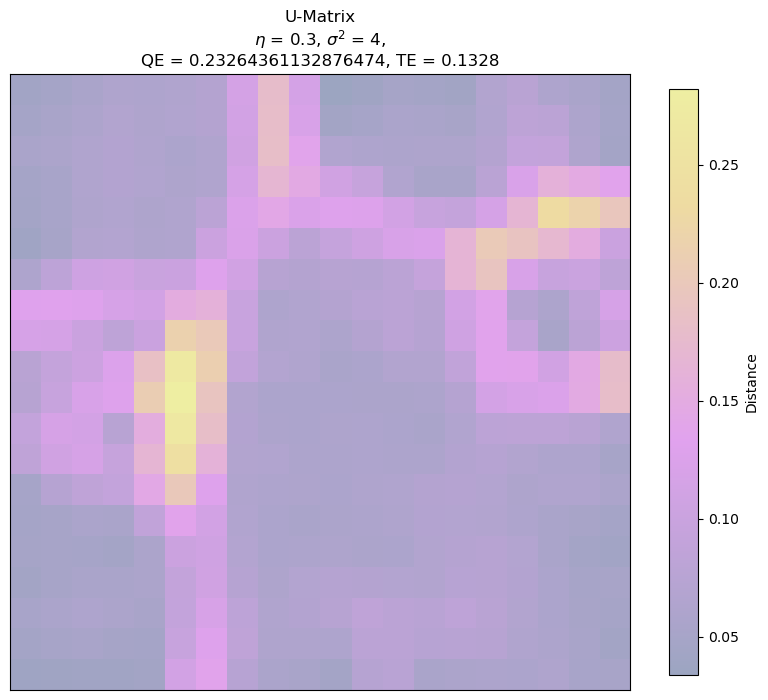

In [68]:
u_matrix_values = u_matrix(SOM1)
QE = round(calculateQE(SOM1, train_data1), 250)
TE = round(calculateTE(SOM1, train_data1), 250)

plt.figure(figsize=(10, 8))
im = plt.imshow(u_matrix_values, cmap=cmap, aspect='auto')
plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
plt.colorbar(im, shrink=0.95, label='Distance')
plt.xticks([])
plt.yticks([])
plt.show()

In [69]:
PARAGRAPHS1 = PARAGRAPHS[:10000]

In [70]:
PREPROCESSED2 = []
with open('PREPROCESSED2.txt', 'r', encoding='utf-8') as f: 
    for line in f:  
        PREPROCESSED2.append(line.strip())

In [71]:
PREPROCESSED2_10000 = PREPROCESSED2[:10000]
len(PREPROCESSED2_10000)

10000

In [72]:
from gensim.models.doc2vec import TaggedDocument, Doc2Vec

In [73]:
DOC2VEC_DOCUMENTS = [TaggedDocument(doc, [i]) for i, doc in enumerate(PREPROCESSED2_10000)]

DOC2VEC_MODEL = Doc2Vec(vector_size=250, min_count=0, alpha=0.025, min_alpha=0.025, epochs=100)
DOC2VEC_MODEL.build_vocab(DOC2VEC_DOCUMENTS)
DOC2VEC_MODEL.train(DOC2VEC_DOCUMENTS, total_examples=DOC2VEC_MODEL.corpus_count, epochs=100)

In [74]:
data_dict1 = []
for i in range(len(SOM1)):
    row = []
    for j in range(len(SOM1[0])):
        row.append([])
    data_dict1.append(row)
vectortextPairs=[]
for i in range(0,len(PARAGRAPHS1)):
    vectortext={}
    vectortext['text']=PARAGRAPHS1[i]
    vectortext['vector']=train_data1[i]
    vectortextPairs.append(vectortext)
for i in vectortextPairs:
    g,h = find_BMU(SOM1,i['vector'])
    data_dict1[g][h].append(i)

In [75]:
def preprocess2(paragraphs):
    lemmatizer = WordNetLemmatizer()
    STOP_WORDS = set(stopwords.words("english"))

    processed_docs = []

    for paragraph in paragraphs:
        words = gensim.utils.simple_preprocess(paragraph, min_len=3, deacc=True)
        lemmatized_words = [lemmatizer.lemmatize(word) for word in words]
        filtered_words = [word for word in lemmatized_words if word not in STOP_WORDS]
        processed_docs.append(filtered_words)
    
    return processed_docs

In [76]:
def search_TextSom1(SOM1, model, data_dict1, query='street'):
    result = []

    # Process query
    query = [query]
    preprocessed_query = preprocess2(query)
    query_vector = DOC2VEC_MODEL.infer_vector(preprocessed_query[0])

    # Activate and display SOM
    fig = plt.figure()
    plt.figure(figsize=(5, 5))
    plt.imshow(activate1(train_data1, SOM1, query_vector), cmap=cmap)
    plt.show()

    # Find BMU location
    g, h = find_BMU1(SOM1, query_vector)
    print((g, h))

    # Check if BMU cell is empty
    if g >= len(data_dict1) or h >= len(data_dict1[g]) or not data_dict1[g][h]:
        print("No data found for this BMU.")
        return []

    # Calculate similarity and find the most similar paragraph
    similarities = {}
    for i in data_dict1[g][h]:
        vector_array = np.array([i['vector']])
        vector_array = vector_array.reshape(1, -1)
        similarities[i['text']['paragraph']] = cosine_similarity(vector_array, [SOM1[g][h]])[0][0]

    # Find the most similar paragraph
    if similarities:
        biggest = max(similarities, key=similarities.get)
        result.append(biggest)
    else:
        print("No similarities found.")

    return result

In [77]:
contents

['The image features a small white doorway surrounded by greenery and flowers.\n\nThe doorway is surrounded by bushes, trees, and flowers, creating a serene and peaceful atmosphere. The door is surrounded by greenery, making it an attractive and inviting entrance. The surrounding environment creates a calming ambiance, perfect for relaxation or a quiet walk']

<Figure size 640x480 with 0 Axes>

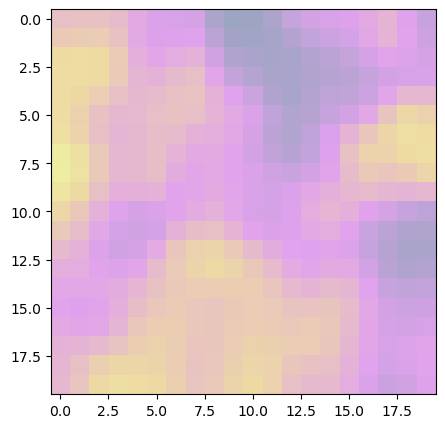

(8, 0)


[' So it is always. Good crystals are friendly with almost all other good crystals, however little they chance to see of each other, or however opposite their habits may be; while wicked crystals quarrel with one another, though they may be exactly alike in habits, and see each other continually.']

In [78]:
search_TextSom1(SOM1,DOC2VEC_MODEL,data_dict1,contents[0])

# photo to video

In [79]:
Path = [item['image'] for item in result5]

In [80]:
Path

['D:\\rc11\\collection\\images\\garden\\image723.jpg']

In [81]:
# Return the (g,h) index of the BMU in the grid
def find_BMU(SOM,x):
    distSq = (np.square(SOM - x)).sum(axis=2)
    return np.unravel_index(np.argmin(distSq, axis=None), distSq.shape)

# Update the weights of the SOM cells when given a single training example
# and the model parameters along with BMU coordinates as a tuple
def update_weights(SOM, train_ex, learn_rate, radius_sq,
                   BMU_coord, step=3):
    g, h = BMU_coord
    #if radius is close to zero then only BMU is changed
    if radius_sq < 1e-3:
        SOM[g,h,:] += learn_rate * (train_ex - SOM[g,h,:])
        return SOM
    # Change all cells in a small neighborhood of BMU
    for i in range(max(0, g-step), min(SOM.shape[0], g+step)):
        for j in range(max(0, h-step), min(SOM.shape[1], h+step)):
            dist_sq = np.square(i - g) + np.square(j - h)
            dist_func = np.exp(-dist_sq / 2 / radius_sq)
            SOM[i,j,:] += learn_rate * dist_func * (train_ex - SOM[i,j,:])
    return SOM

# Main routine for training an SOM. It requires an initialized SOM grid
# or a partially trained grid as parameter
def train_SOM(SOM, train_data, learn_rate = .1, radius_sq = 1,
             lr_decay = .1, radius_decay = .1, epochs = 10):
    learn_rate_0 = learn_rate
    radius_0 = radius_sq
    for epoch in np.arange(0, epochs):
        np.random.shuffle(train_data)
        for train_ex in train_data:
            g, h = find_BMU(SOM, train_ex)
            SOM = update_weights(SOM, train_ex,
                                 learn_rate, radius_sq, (g,h))
        # Update learning rate and radius
        learn_rate = learn_rate_0 * np.exp(-epoch * lr_decay)
        radius_sq = radius_0 * np.exp(-epoch * radius_decay)
    return SOM
import scipy
def calculateQE(SOM,data):
    sumSqDist = 0
    for d in data:
        g,h = find_BMU(SOM, d)
        v1 = SOM[g,h]
        v2 = d
        sumSqDist += scipy.spatial.distance.cdist([v1],[v2],'sqeuclidean')[0][0]
    QE = sumSqDist/len(data)
    return QE
    
# Return the (g,h) index of the BMU in the grid
def find_BMU_2(SOM,x):
    distSq = (np.square(SOM - x)).sum(axis=2)
    return np.unravel_index(np.argpartition(distSq, 2, axis=None)[2], distSq.shape)
    

def calculateTE(SOM, data):
    failed = 0
    for d in data:
        g1, h1 = find_BMU(SOM, d)
        g2, h2 = find_BMU_2(SOM, d)
        coord1 = np.array([g1, h1])
        coord2 = np.array([g2, h2])
        dist = euclidean(coord1, coord2)

        if dist > 1:
            failed += 1

    return failed / len(data)
    
def activate(train_data, SOM, p):
    normalP = normalise(train_data, p)
    activatedSOM = np.array([[euclidean(normalP, c) for c in r] for r in SOM])
    normalisedActivatedSOM = normalise(activatedSOM, activatedSOM)
    activatedSOM = (normalisedActivatedSOM -1)*(-1)
    return activatedSOM

def normalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    normalised_p = (p-min_d)/(max_d - min_d)
    return normalised_p

def denormalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    denormalised_p = p * (max_d - min_d) + min_d
    return denormalised_p

def euclidean(a, b):
    return np.linalg.norm(a-b)

def u_matrix(lattice):

    """Builds a U-matrix on top of the trained lattice.

        Parameters
        ---
        lattice : list

            The SOM generated lattice

        Returns
        ---
        The lattice of the shape (R,C):

        R - number of rows; C - number of columns;
        """
    X, Y, Z = lattice.shape
    u_values = np.empty((X,Y), dtype=np.float64) #初始化空矩阵存储计算出的距离值。矩阵大小与SOM的行数和列数相同

    for y in range(Y):
        for x in range(X):
            current = lattice[x,y]
            dist = 0
            num_neigh = 0
            #对每个节点，计算其与其周围的欧氏距离（上下左右及对角线）
            # left
            if x-1 >= 0:
                #middle
                vec = lattice[x-1,y]
                dist += euclidean(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    #sup
                    vec = lattice[x-1, y-1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
                if y + 1 < Y:
                    # down
                    vec = lattice[x-1,y+1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
            # middle
            if y - 1 >= 0:
                # up
                vec = lattice[x,y-1]
                dist += euclidean(current, vec)
                num_neigh += 1
            # down
            if y + 1 < Y:
                vec = lattice[x,y+1]
                dist += euclidean(current, vec)
                num_neigh += 1
            # right
            if x + 1 < X:
                # middle
                vec = lattice[x+1,y]
                dist += euclidean(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    #up
                    vec = lattice[x+1,y-1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
                if y + 1 < lattice.shape[1]:
                    # down
                    vec = lattice[x+1,y+1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
            u_values[x,y] = dist / num_neigh #计算与邻居节点的平均距离
    u_values = (u_values - 1) * -1
    return u_values

In [89]:
with open('Video_featureSOM.pkl', 'rb') as f:
    SOM4= pickle.load(f)

In [90]:
import json
def load_from_json(filename):
    with open(filename, 'r') as f:
        data = json.load(f)
    return data
film_features = load_from_json('Database03_filmfeatures.json')

In [91]:
train_data4 = [item['features'] for item in film_features]

In [92]:
n_train_data4 = normalise(train_data4, train_data4)

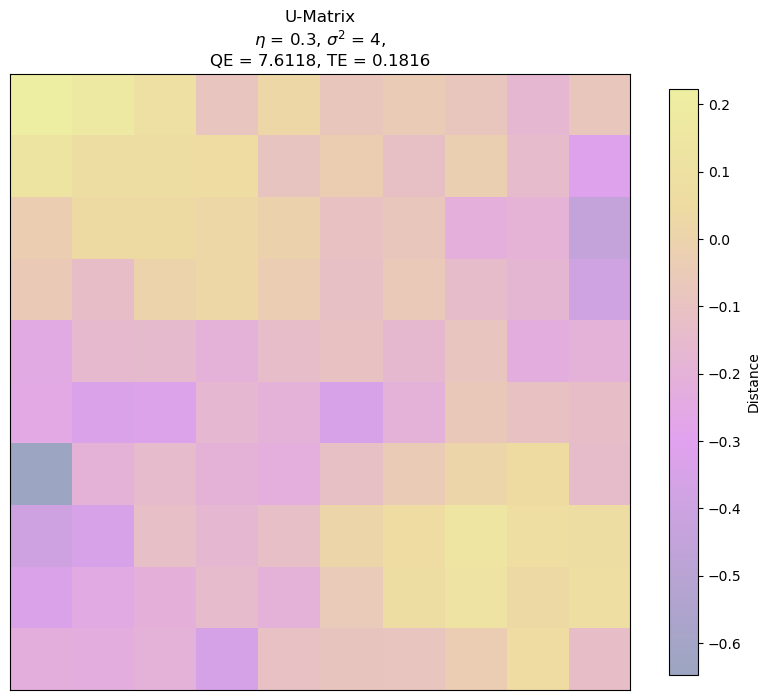

In [93]:
u_matrix_values = u_matrix(SOM4)
QE = round(calculateQE(SOM4, n_train_data4), 4)
TE = round(calculateTE(SOM4, n_train_data4), 4)

plt.figure(figsize=(10, 8))
im = plt.imshow(u_matrix_values, cmap=cmap, aspect='auto')
plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
plt.colorbar(im, shrink=0.95, label='Distance')
plt.xticks([])
plt.yticks([])
plt.show()

In [94]:
def get_closest_image1(a,b):
  cell = SOM4[a][b]
  distance = [distance_between(cell, i['features']) for i in video_picture_data_dict[a][b]]
  closest_image_index=find_closest_image_index(distance)
  return closest_image_index

In [95]:
video_picture_data_dict = []
for i in range(len(SOM4)):
    row = []
    for j in range(len(SOM4[0])):
        row.append([])
    video_picture_data_dict.append(row)

for item in film_features:
    features = item['features']
    path = item['film']
    g, h = find_BMU(SOM4, features)
    video_picture_data_dict[g][h].append({'features': features, 'image': path})

In [96]:
def distance_between(a, b):
    a = np.asarray(a, dtype=np.float64)
    b = np.asarray(b, dtype=np.float64)
    return np.linalg.norm(a - b)

In [97]:
def find_closest_image_index(distance):
    closest_index = 0
    distance_closest = distance[0]

    for index in range(1, len(distance)):
        if distance[index] < distance_closest:
            distance_closest = distance[index]
            closest_index = index

    return closest_index

In [98]:
def searchvideopicturesom4(query):
    result = []
    query_features = []
    path = query
    q_f = processImage(path, model)
    query_features.append(q_f)

    print(f"Query features shape: {np.array(query_features).shape}")
    activatedSOM = activate(n_train_data4, SOM4, query_features)

    g, h = find_BMU(SOM4, query_features[0])
    print(f"BMU location: ({g}, {h})")

    plt.figure(figsize=(5, 4))
    im = plt.imshow(activatedSOM, cmap=cmap, aspect='auto')
    plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4}')
    plt.colorbar(im, shrink=0.95, label='Distance')
    plt.xticks([])
    plt.yticks([])
    plt.show()

    closest_image_index = get_closest_image1(g, h)
    result.append(video_picture_data_dict[g][h][closest_image_index]['image'])
    return result

In [99]:
Path

['D:\\rc11\\collection\\images\\garden\\image723.jpg']

1/1 [==============================] - 0s 115ms/step
Query features shape: (1, 1024)
BMU location: (6, 2)


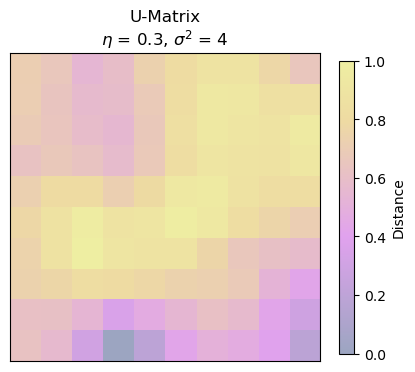

In [100]:
query = Path[0]
result4 = searchvideopicturesom4(query)

In [101]:
result4[0]

'D:\\rc11\\collection\\video\\ballroom\\video_31.mp4'

Moviepy - Building video output_videos\image723_trimmed_video.mp4.
MoviePy - Writing audio in image723_trimmed_videoTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video output_videos\image723_trimmed_video.mp4



Moviepy - Done !
Moviepy - video ready output_videos\image723_trimmed_video.mp4
saved to：output_videos\image723_trimmed_video.mp4


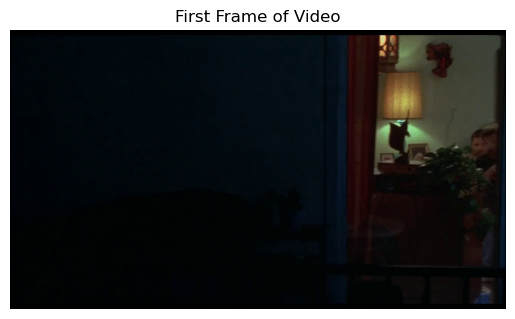

In [102]:
import os
from moviepy.video.io.VideoFileClip import VideoFileClip
import matplotlib.pyplot as plt

base_name = os.path.splitext(os.path.basename(query))[0]
video_path = result4[0]
matching_feature = next((f for f in film_features if f['film'] == video_path), None)

if matching_feature:
    start_time = matching_feature['second']
    end_time = start_time + 5
    clip = VideoFileClip(video_path).subclip(start_time, end_time)

    output_directory = "output_videos"
    os.makedirs(output_directory, exist_ok=True)

    output_path = os.path.join(output_directory, f"{base_name}_trimmed_video.mp4")
    clip.write_videofile(output_path, codec='libx264', fps=24)
    print(f"saved to：{output_path}")

    first_frame = clip.get_frame(0)  
    plt.imshow(first_frame)
    plt.axis('off')  
    plt.title("First Frame of Video")
    plt.show()

else:
    print(f" `film_features` no {video_path}")

# Search

In [107]:
path_prefix = r"D:\rc11\collection\images\museum"
query_texts = [
    fr"{path_prefix}\6210142306_20ffdb0644.jpg",
    fr"{path_prefix}\29062264164_48e14826f2_z.jpg",
    fr"{path_prefix}\32779465238_33294c198c_w.jpg",
    fr"{path_prefix}\51788066878_5423b8b681_n.jpg",
    fr"{path_prefix}\52740191038_8245d12cc6_z.jpg",
    fr"{path_prefix}\52891876120_cde642a2ec.jpg",
    fr"{path_prefix}\52900762653_44466b92f6_z.jpg",
    fr"{path_prefix}\53005739307_25e9604c27_z.jpg",
    fr"{path_prefix}\53252360455_d8fedbb3d2_n.jpg",
    fr"{path_prefix}\53501844726_1db8731aa5_z.jpg"
]

In [108]:
import os
from moviepy.video.io.VideoFileClip import VideoFileClip
import matplotlib.pyplot as plt

def process_video_from_query(query, searchvideopicturesom5, searchvideopicturesom4, search_TextSom1, SOM1, DOC2VEC_MODEL, data_dict1, film_features, duration=5, output_directory="output_videos"):
    result5 = searchvideopicturesom5(query)
    show_query_and_results(query, result5)
    contents = [item['content'] for item in result5]
    print(contents)
    
    result6 = search_TextSom1(SOM1, DOC2VEC_MODEL, data_dict1, contents[0])
    print(result6)

    Path = [item['image'] for item in result5]
    query = Path[0]

    result4 = searchvideopicturesom4(query)

    base_name = os.path.splitext(os.path.basename(query))[0]
    video_path = result4[0]

    matching_feature = next((f for f in film_features if f['film'] == video_path), None)

    if matching_feature:
        start_time = matching_feature['second']
        end_time = start_time + duration

        clip = VideoFileClip(video_path).subclip(start_time, end_time)
        os.makedirs(output_directory, exist_ok=True)
        output_path = os.path.join(output_directory, f"{base_name}_trimmed_video.mp4")
        clip.write_videofile(output_path, codec='libx264', fps=24)
        print(f"frame saved to：{output_path}")

        first_frame = clip.get_frame(0)
        plt.imshow(first_frame)
        plt.axis('off')
        plt.title("First Frame of Video")
        plt.show()

    else:
        print(f"`film_features` saved to：{video_path}")


1/1 [==============================] - 0s 94ms/step
Query features shape: (1, 1024)
BMU location: (6, 7)


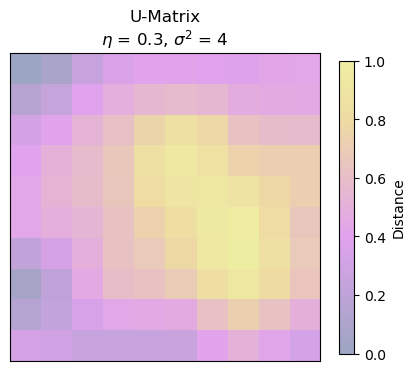

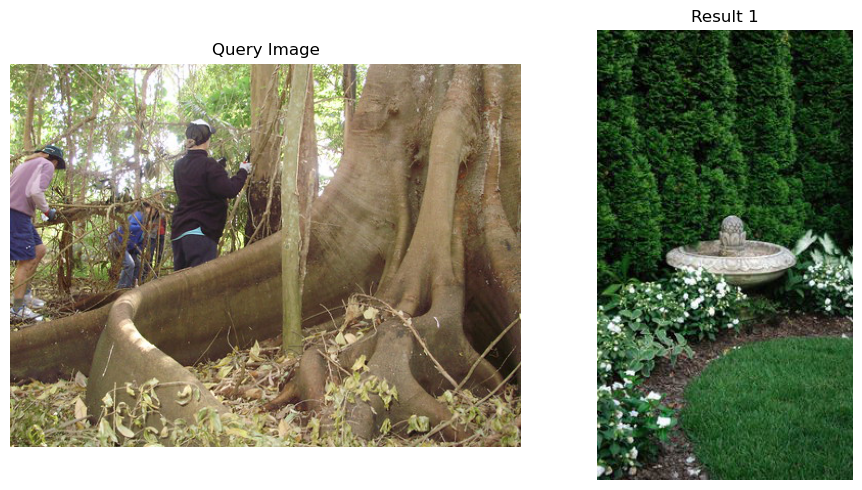

['The image features a garden with a fountain surrounded by green shrubbery and flowers.\n\nThere are multiple potted plants scattered throughout the garden, some close to the fountain and others further away. Additionally, there is a bird bath situated in the middle of the garden. The garden also features a bird, possibly tending to its eggs or resting. The combination of plants and bird bath']


<Figure size 640x480 with 0 Axes>

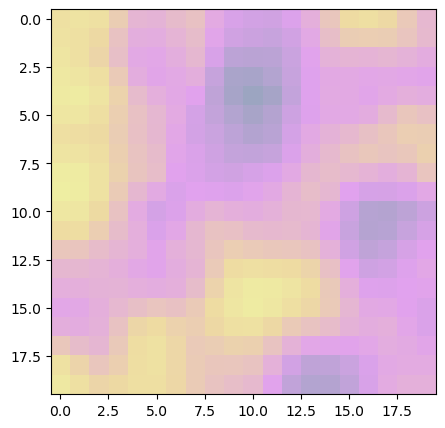

(9, 0)
[' It contains ten hundred and sixty-nine hectares and was due originally to Louis XV, who sought to have a sylvan gateway to the city from the east. Under the Second Empire the park was considerably transformed, new roads and alleys traced, and an effort made to have it equal more nearly the beauty of the more popular Bois de Boulogne.']
1/1 [==============================] - 0s 107ms/step
Query features shape: (1, 1024)
BMU location: (2, 9)


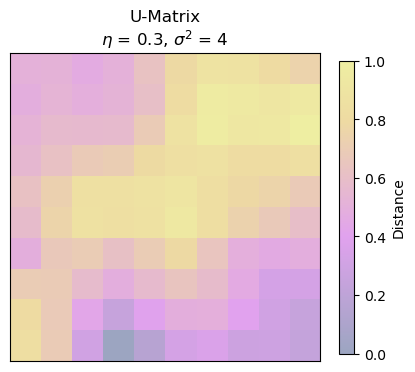

Moviepy - Building video output_videos\image575_trimmed_video.mp4.
MoviePy - Writing audio in image575_trimmed_videoTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video output_videos\image575_trimmed_video.mp4



Moviepy - Done !
Moviepy - video ready output_videos\image575_trimmed_video.mp4
frame saved to：output_videos\image575_trimmed_video.mp4


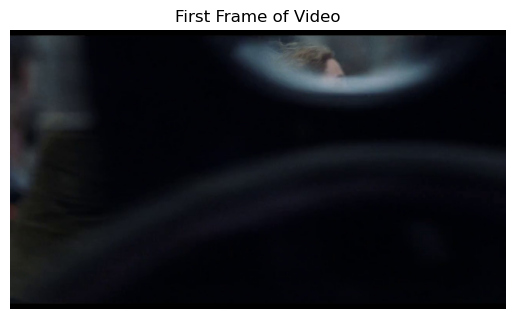

In [109]:
query = query_texts[0]
process_video_from_query(
    query,
    searchvideopicturesom5,
    searchvideopicturesom4,
    search_TextSom1,
    SOM1,
    DOC2VEC_MODEL,
    data_dict1,
    film_features,
    duration=5
)

1/1 [==============================] - 0s 95ms/step
Query features shape: (1, 1024)
BMU location: (7, 7)


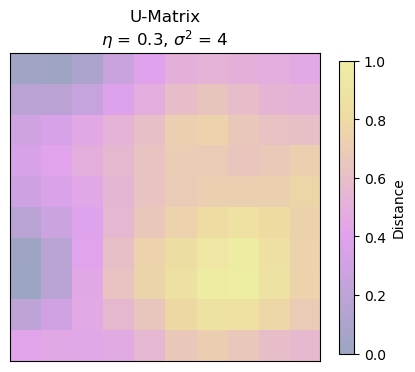

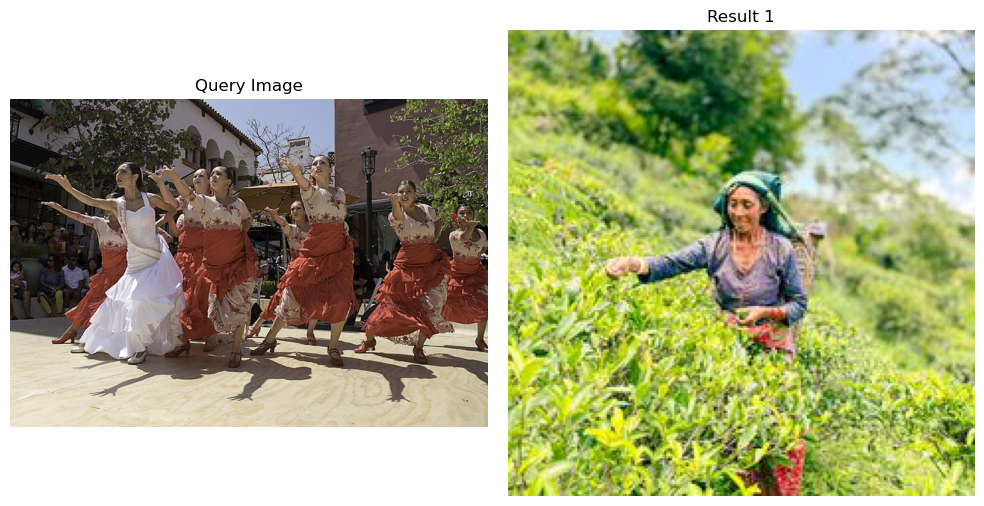

['The image features a woman standing in a grassy field, surrounded by bushes and trees. She is wearing a purple shirt and appears to be surrounded by greenery.\n\nIn the scene, there are also two birds present. One is flying above the woman, while the other is perched on a bush nearby. Additionally, there is a person standing nearby, possibly observing the woman or interacting with the']


<Figure size 640x480 with 0 Axes>

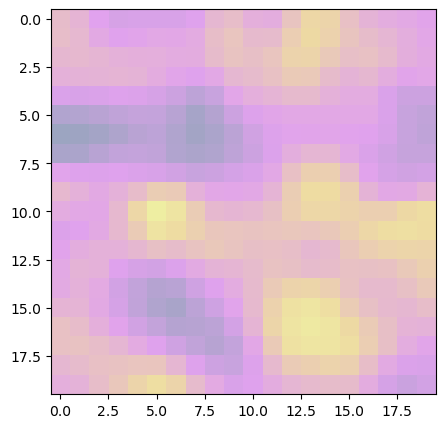

(10, 5)
[' “Do you warrant it?” he asked, turning the nose to the light. “I do,” said I, blowing it well. “Is it quite original?” he inquired; touching it with reverence. “Humph!” said I, twisting it to one side.']
1/1 [==============================] - 0s 118ms/step
Query features shape: (1, 1024)
BMU location: (5, 5)


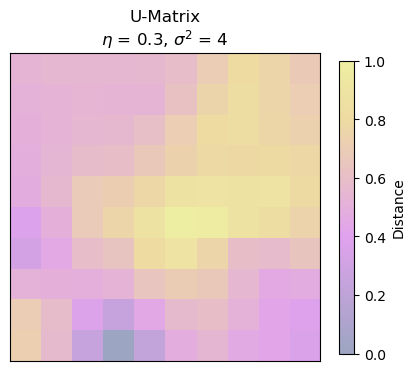

Moviepy - Building video output_videos\image481_trimmed_video.mp4.
MoviePy - Writing audio in image481_trimmed_videoTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video output_videos\image481_trimmed_video.mp4



Moviepy - Done !
Moviepy - video ready output_videos\image481_trimmed_video.mp4
frame saved to：output_videos\image481_trimmed_video.mp4


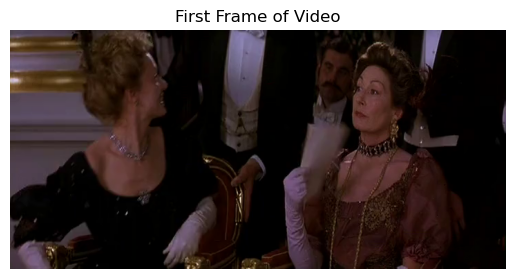

In [110]:
query = query_texts[1]
process_video_from_query(
    query,
    searchvideopicturesom5,
    searchvideopicturesom4,
    search_TextSom1,
    SOM1,
    DOC2VEC_MODEL,
    data_dict1,
    film_features,
    duration=5
)

1/1 [==============================] - 0s 95ms/step
Query features shape: (1, 1024)
BMU location: (4, 9)


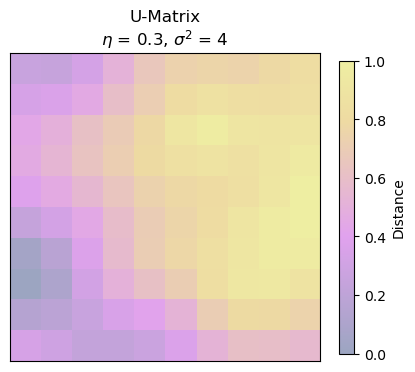

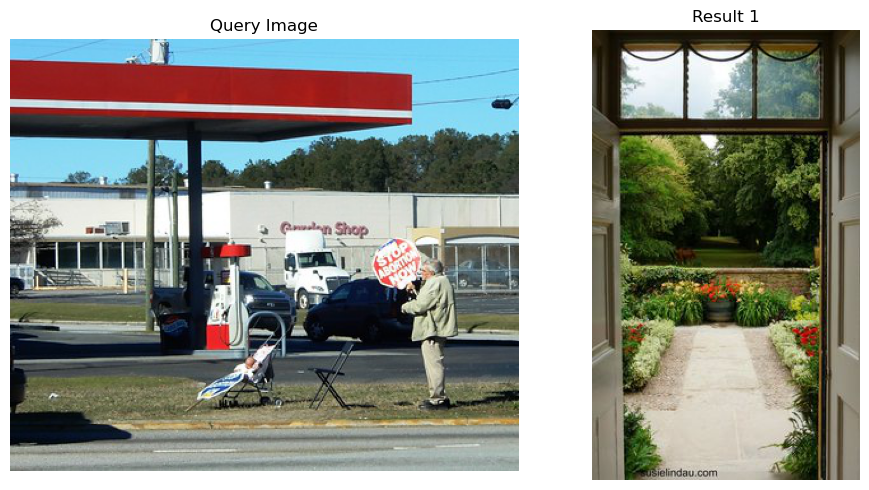

['The image features an open doorway leading into a garden with a walkway surrounded by various plants and flowers.\n\nThere are multiple potted plants scattered throughout the garden, some closer to the walkway and others further away. A variety of flowers, including tulips, are also present in the garden, adding to the vibrant atmosphere. The garden is surrounded by trees, creating a']


<Figure size 640x480 with 0 Axes>

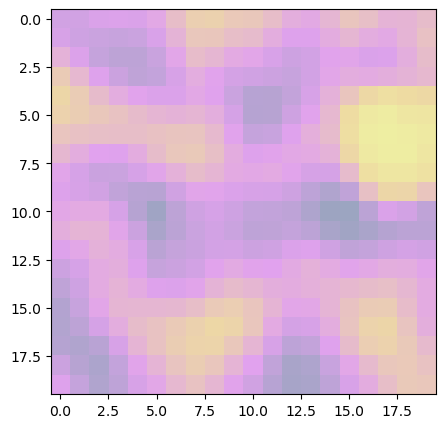

(6, 17)
[' The style!—that was the thing. I caught it from Fatquack—whizz!—fizz!—— and I am giving you a specimen of it now..']
1/1 [==============================] - 0s 94ms/step
Query features shape: (1, 1024)
BMU location: (1, 6)


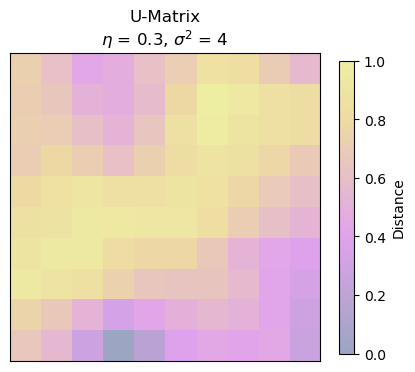

Moviepy - Building video output_videos\image794_trimmed_video.mp4.
MoviePy - Writing audio in image794_trimmed_videoTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video output_videos\image794_trimmed_video.mp4



Moviepy - Done !
Moviepy - video ready output_videos\image794_trimmed_video.mp4
frame saved to：output_videos\image794_trimmed_video.mp4


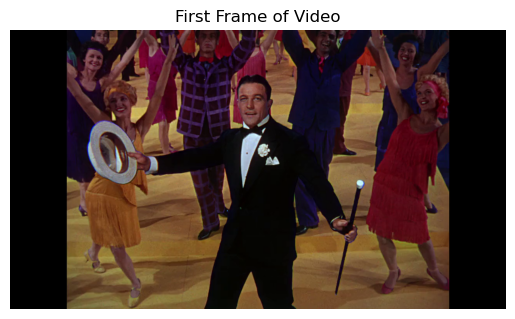

In [111]:
query = query_texts[2]
process_video_from_query(
    query,
    searchvideopicturesom5,
    searchvideopicturesom4,
    search_TextSom1,
    SOM1,
    DOC2VEC_MODEL,
    data_dict1,
    film_features,
    duration=5
)

1/1 [==============================] - 0s 104ms/step
Query features shape: (1, 1024)
BMU location: (7, 7)


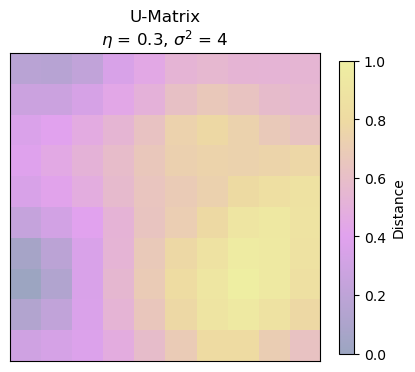

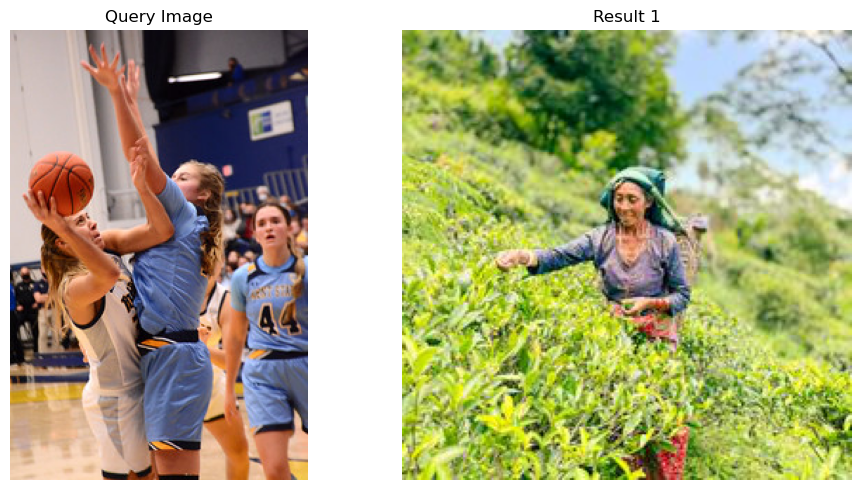

['The image features a woman standing in a grassy field, surrounded by bushes and trees. She is wearing a purple shirt and appears to be surrounded by greenery.\n\nIn the scene, there are also two birds present. One is flying above the woman, while the other is perched on a bush nearby. Additionally, there is a person standing nearby, possibly observing the woman or interacting with the']


<Figure size 640x480 with 0 Axes>

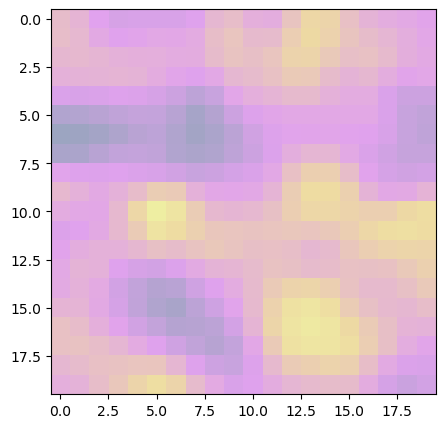

(10, 5)
[' “Do you warrant it?” he asked, turning the nose to the light. “I do,” said I, blowing it well. “Is it quite original?” he inquired; touching it with reverence. “Humph!” said I, twisting it to one side.']
1/1 [==============================] - 0s 76ms/step
Query features shape: (1, 1024)
BMU location: (5, 5)


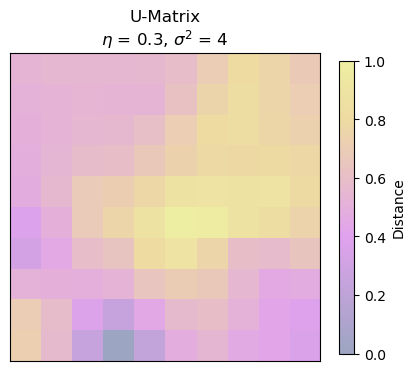

Moviepy - Building video output_videos\image481_trimmed_video.mp4.
MoviePy - Writing audio in image481_trimmed_videoTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video output_videos\image481_trimmed_video.mp4



Moviepy - Done !
Moviepy - video ready output_videos\image481_trimmed_video.mp4
frame saved to：output_videos\image481_trimmed_video.mp4


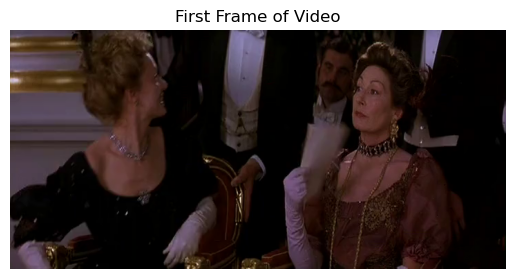

In [112]:
query = query_texts[3]
process_video_from_query(
    query,
    searchvideopicturesom5,
    searchvideopicturesom4,
    search_TextSom1,
    SOM1,
    DOC2VEC_MODEL,
    data_dict1,
    film_features,
    duration=5
)

1/1 [==============================] - 0s 104ms/step
Query features shape: (1, 1024)
BMU location: (2, 6)


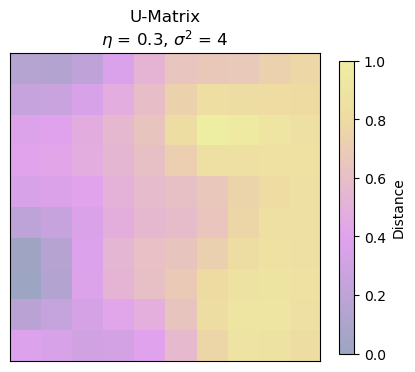

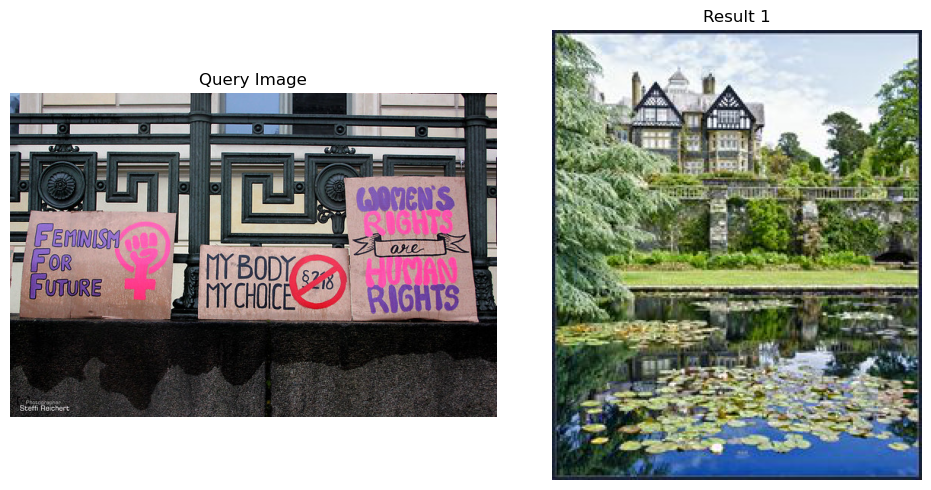

['The image features a beautiful house with a pond in front of it. The pond is filled with lily pads and lilies, creating a peaceful and serene atmosphere.\n\nThere are multiple lily pads floating on the water, with some close to the house and others farther away. Alongside the pond, there is a large house with a tower and a balcony, adding']


<Figure size 640x480 with 0 Axes>

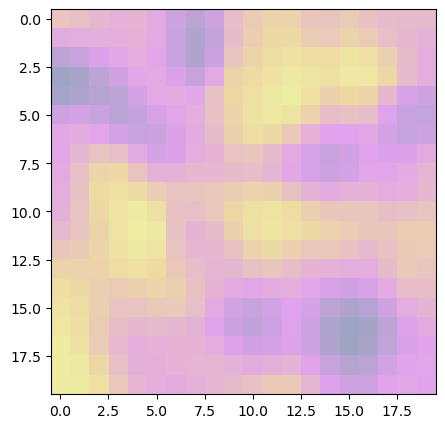

(4, 12)
[' Of course she is married, so she must wear a cap with pretty minute pendant jewels at the border; and a very small necklace, all that her husband can properly afford, just enough to go closely round the neck, and no more.']
1/1 [==============================] - 0s 100ms/step
Query features shape: (1, 1024)
BMU location: (2, 9)


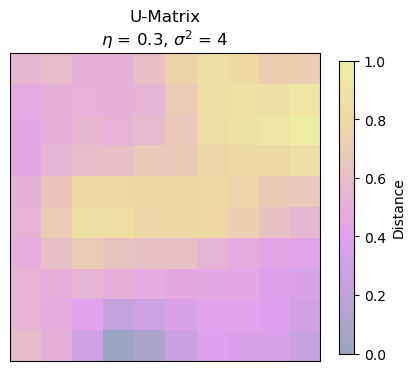

Moviepy - Building video output_videos\image600_trimmed_video.mp4.
MoviePy - Writing audio in image600_trimmed_videoTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video output_videos\image600_trimmed_video.mp4



Moviepy - Done !
Moviepy - video ready output_videos\image600_trimmed_video.mp4
frame saved to：output_videos\image600_trimmed_video.mp4


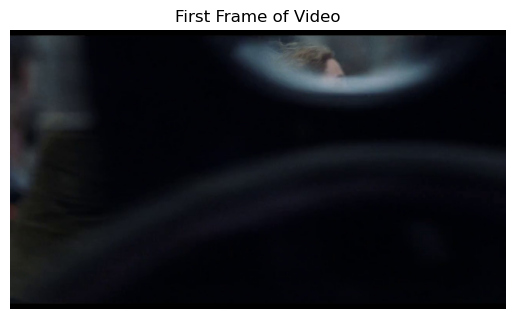

In [113]:
query = query_texts[4]
process_video_from_query(
    query,
    searchvideopicturesom5,
    searchvideopicturesom4,
    search_TextSom1,
    SOM1,
    DOC2VEC_MODEL,
    data_dict1,
    film_features,
    duration=5
)

1/1 [==============================] - 0s 90ms/step
Query features shape: (1, 1024)
BMU location: (8, 6)


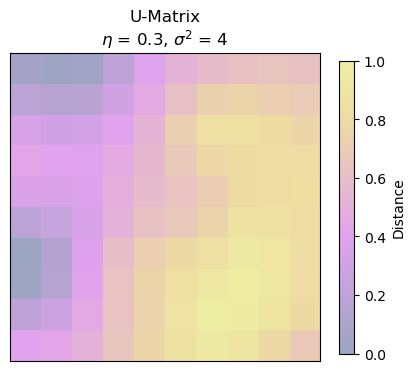

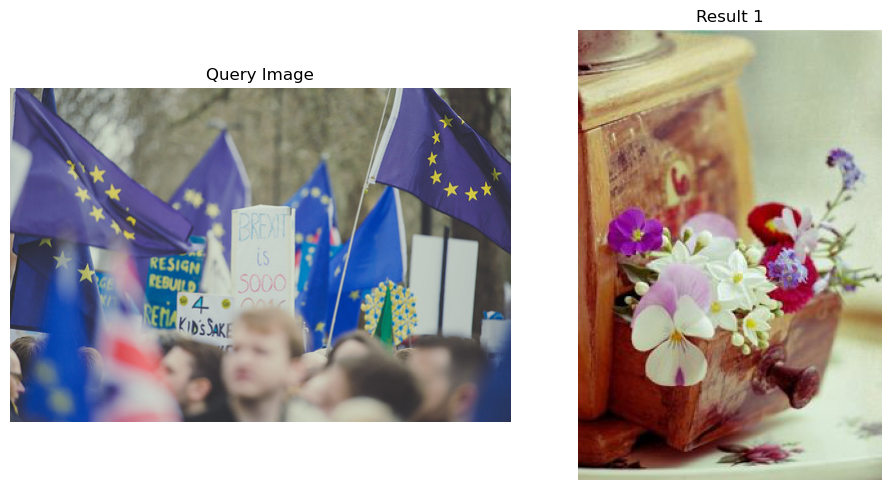

['The image features a pair of boots filled with colorful flowers, possibly pansies or daisies, and a book. The boots are filled with flowers, creating a vibrant and eye-catching display. The book, which is positioned to the left of the boots and flowers, likely contains information related to the flowers or possibly contains recipes or instructions related to the flowers. The scene convey']


<Figure size 640x480 with 0 Axes>

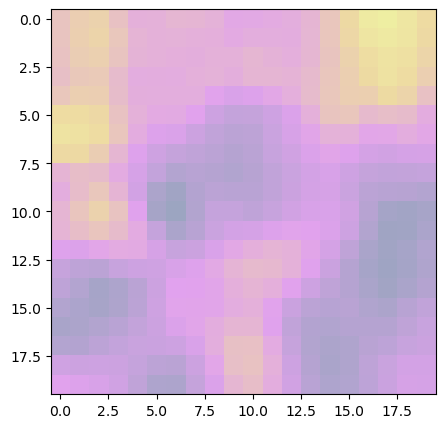

(0, 17)
[' Project Gutenberg is a registered trademark, and may not be used if you charge for an eBook, except by following the terms of the trademark license, including paying royalties for use of the Project Gutenberg trademark.']
1/1 [==============================] - 0s 92ms/step
Query features shape: (1, 1024)
BMU location: (2, 7)


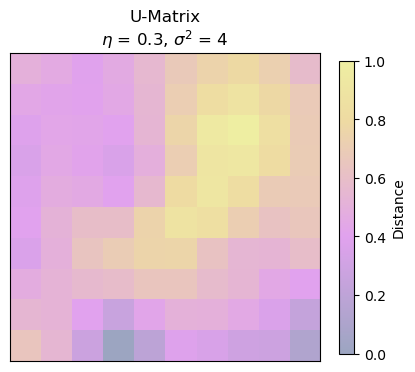

Moviepy - Building video output_videos\image33_trimmed_video.mp4.
MoviePy - Writing audio in image33_trimmed_videoTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video output_videos\image33_trimmed_video.mp4



Moviepy - Done !
Moviepy - video ready output_videos\image33_trimmed_video.mp4
frame saved to：output_videos\image33_trimmed_video.mp4


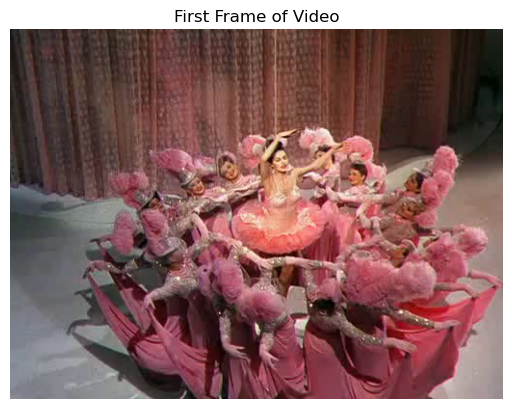

In [114]:
query = query_texts[5]
process_video_from_query(
    query,
    searchvideopicturesom5,
    searchvideopicturesom4,
    search_TextSom1,
    SOM1,
    DOC2VEC_MODEL,
    data_dict1,
    film_features,
    duration=5
)

1/1 [==============================] - 0s 89ms/step
Query features shape: (1, 1024)
BMU location: (5, 7)


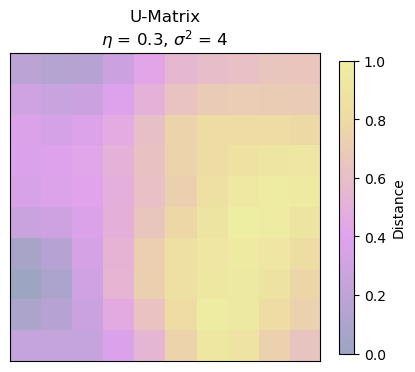

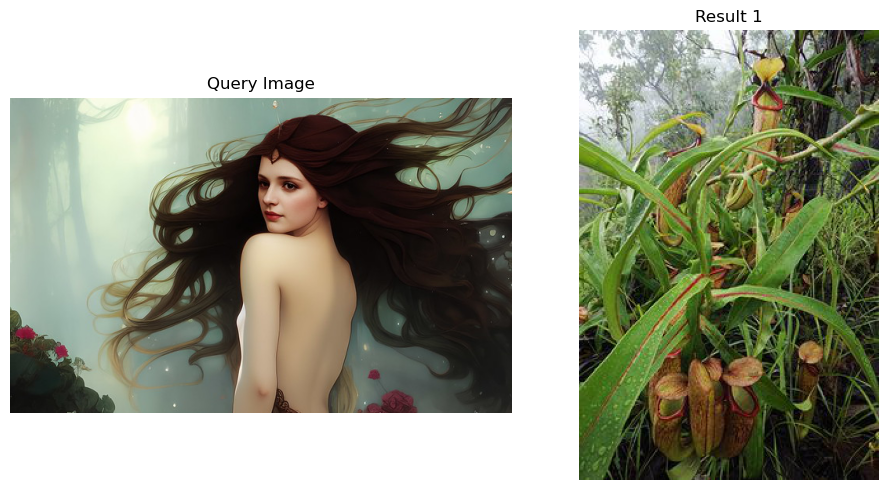

['The image features a large group of clumps of carnivorous plants, including ferns, growing together in a forest.\n\nThe ferns are draped over the ground, with some clumps of ferns sprouting up from the ground. These plants have drooping leaves and are characterized by their long,']


<Figure size 640x480 with 0 Axes>

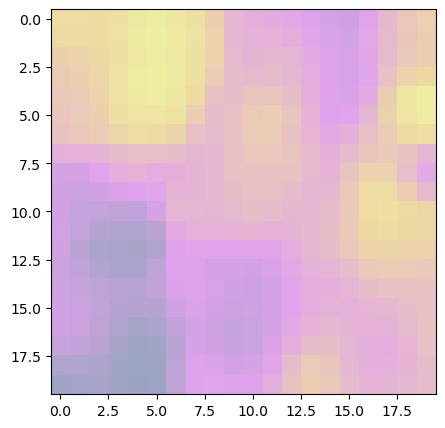

(1, 5)
[' INNOCENCE AND EXPERIENCE I shall not ask the commentators whether Blake used these two words in union or in antithesis. They assuredly have an inseverable union in the art of literature. The songs of Innocence and Experience are for each poet the songs of his own separate heart and life; but to take the cumulative experiences of other men, and to use these in place of the virginal fruit of thought—whereas one would hardly consent to take them for ordering even the most habitual of daily affairs—is to forego Innocence and Experience at once and together.']
1/1 [==============================] - 0s 101ms/step
Query features shape: (1, 1024)
BMU location: (4, 7)


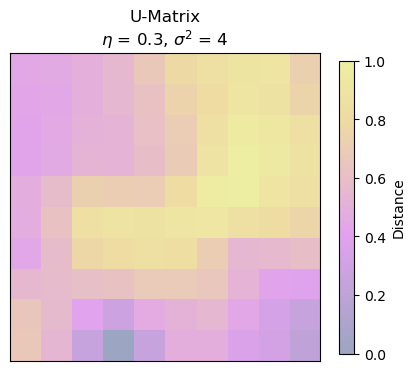

Moviepy - Building video output_videos\image504_trimmed_video.mp4.
MoviePy - Writing audio in image504_trimmed_videoTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video output_videos\image504_trimmed_video.mp4



Moviepy - Done !
Moviepy - video ready output_videos\image504_trimmed_video.mp4
frame saved to：output_videos\image504_trimmed_video.mp4


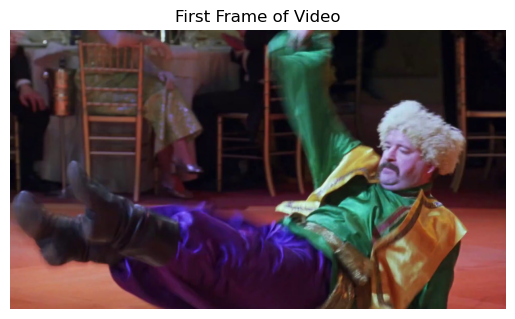

In [115]:
query = query_texts[6]
process_video_from_query(
    query,
    searchvideopicturesom5,
    searchvideopicturesom4,
    search_TextSom1,
    SOM1,
    DOC2VEC_MODEL,
    data_dict1,
    film_features,
    duration=5
)

1/1 [==============================] - 0s 94ms/step
Query features shape: (1, 1024)
BMU location: (7, 6)


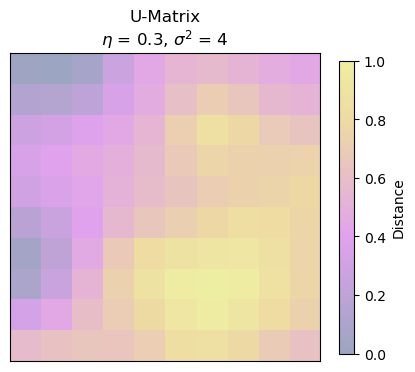

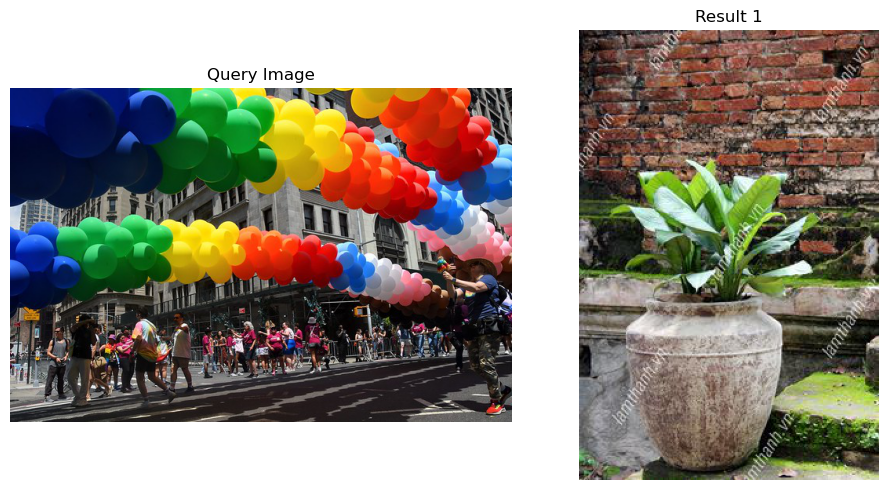

['The image features a large plant or potted plant, which is positioned in front of a brick wall. The plant is surrounded by several bricks, creating a unique setting. There is also a cement planter nearby, containing another plant. The scene conveys a sense of a garden setting, with the brick wall and potted plant serving as a focal point.']


<Figure size 640x480 with 0 Axes>

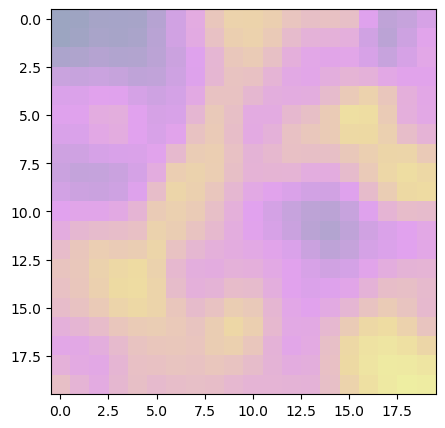

(19, 18)
[' Once more before the catastrophe let us pause and see what monuments had been erected in the Cathedral since the Stuarts mounted the throne. Dean VALENTINE CAREY was also Bishop of Exeter, d. 1626, a High Churchman, He "imprudently commended the soul of a dead person to the mercies of God, which he was forced to retract.']
1/1 [==============================] - 0s 106ms/step
Query features shape: (1, 1024)
BMU location: (1, 7)


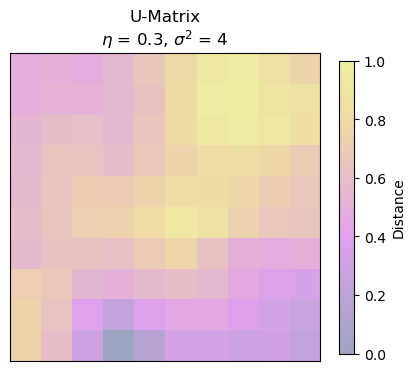

Moviepy - Building video output_videos\image144_trimmed_video.mp4.
MoviePy - Writing audio in image144_trimmed_videoTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video output_videos\image144_trimmed_video.mp4



Moviepy - Done !
Moviepy - video ready output_videos\image144_trimmed_video.mp4
frame saved to：output_videos\image144_trimmed_video.mp4


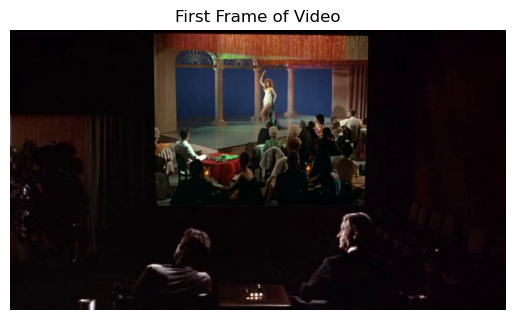

In [116]:
query = query_texts[7]
process_video_from_query(
    query,
    searchvideopicturesom5,
    searchvideopicturesom4,
    search_TextSom1,
    SOM1,
    DOC2VEC_MODEL,
    data_dict1,
    film_features,
    duration=5
)

1/1 [==============================] - 0s 101ms/step
Query features shape: (1, 1024)
BMU location: (7, 8)


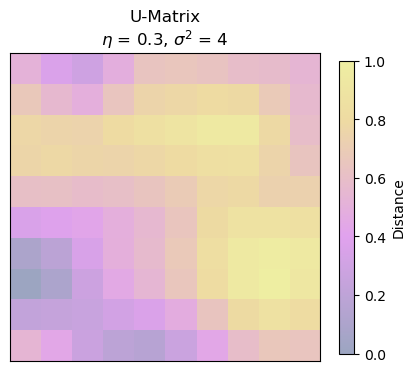

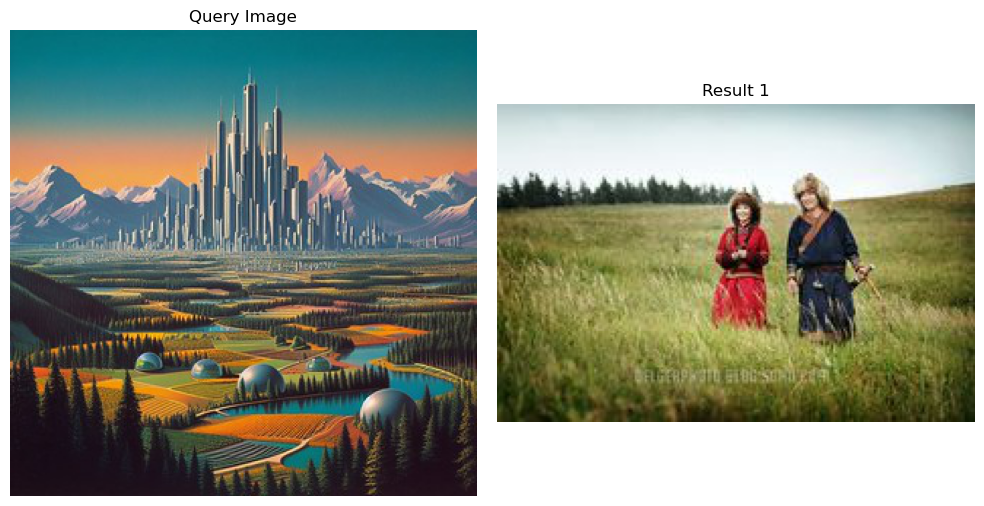

['The image features two women standing in a grassy field, holding string instruments. One of the women is wearing a red dress while the other is wearing a blue dress. They are both holding string instruments, which appear to be fiddles, as they stand in the field.']


<Figure size 640x480 with 0 Axes>

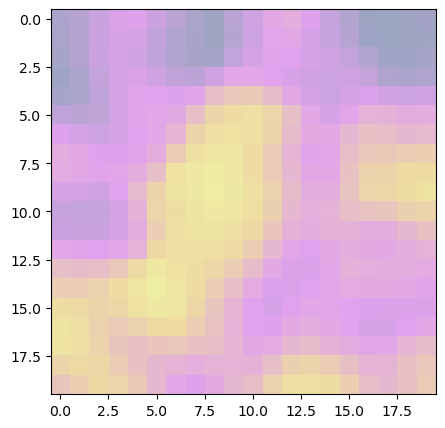

(14, 5)
[' Fearing the results of too precipitate publishing of the disaster no other course was open. A gruesome memory is that the Swiss Guard at the Louvre surreptitiously acquired a "quartier" of the dismembered body of the regicide and roasted it in a fire set alight beneath the balcony of Marie de Médici as an indication of their faithfulness and loyalty.']
1/1 [==============================] - 0s 90ms/step
Query features shape: (1, 1024)
BMU location: (5, 5)


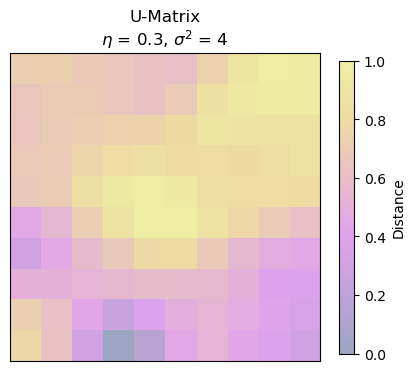

Moviepy - Building video output_videos\image535_trimmed_video.mp4.
MoviePy - Writing audio in image535_trimmed_videoTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video output_videos\image535_trimmed_video.mp4



Moviepy - Done !
Moviepy - video ready output_videos\image535_trimmed_video.mp4
frame saved to：output_videos\image535_trimmed_video.mp4


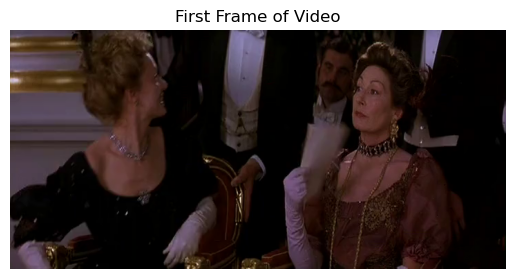

In [117]:
query = query_texts[8]
process_video_from_query(
    query,
    searchvideopicturesom5,
    searchvideopicturesom4,
    search_TextSom1,
    SOM1,
    DOC2VEC_MODEL,
    data_dict1,
    film_features,
    duration=5
)

1/1 [==============================] - 0s 125ms/step
Query features shape: (1, 1024)
BMU location: (5, 7)


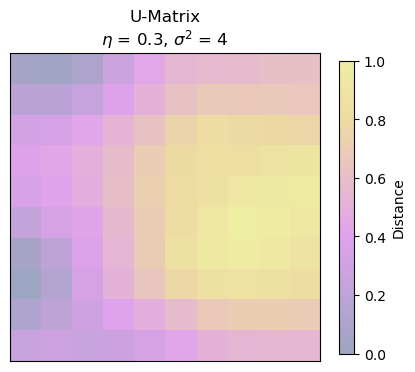

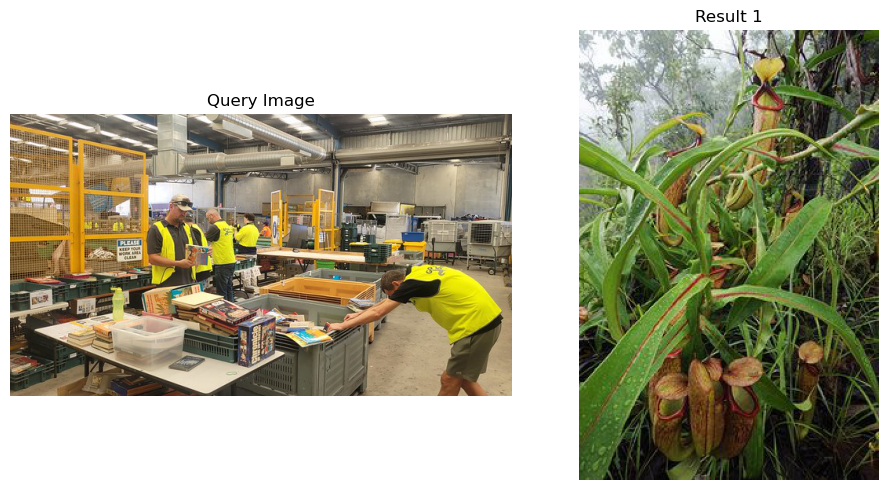

['The image features a large group of clumps of carnivorous plants, including ferns, growing together in a forest.\n\nThe ferns are draped over the ground, with some clumps of ferns sprouting up from the ground. These plants have drooping leaves and are characterized by their long,']


<Figure size 640x480 with 0 Axes>

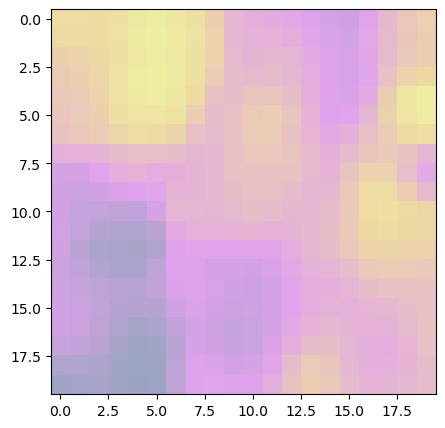

(1, 5)
[' INNOCENCE AND EXPERIENCE I shall not ask the commentators whether Blake used these two words in union or in antithesis. They assuredly have an inseverable union in the art of literature. The songs of Innocence and Experience are for each poet the songs of his own separate heart and life; but to take the cumulative experiences of other men, and to use these in place of the virginal fruit of thought—whereas one would hardly consent to take them for ordering even the most habitual of daily affairs—is to forego Innocence and Experience at once and together.']
1/1 [==============================] - 0s 85ms/step
Query features shape: (1, 1024)
BMU location: (4, 7)


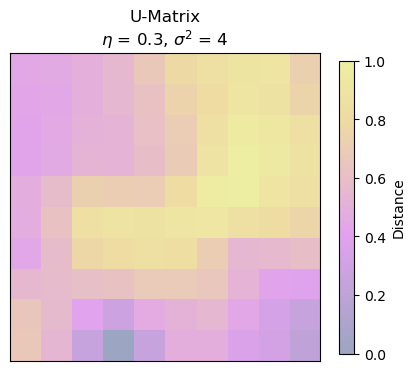

Moviepy - Building video output_videos\image504_trimmed_video.mp4.
MoviePy - Writing audio in image504_trimmed_videoTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video output_videos\image504_trimmed_video.mp4



Moviepy - Done !
Moviepy - video ready output_videos\image504_trimmed_video.mp4
frame saved to：output_videos\image504_trimmed_video.mp4


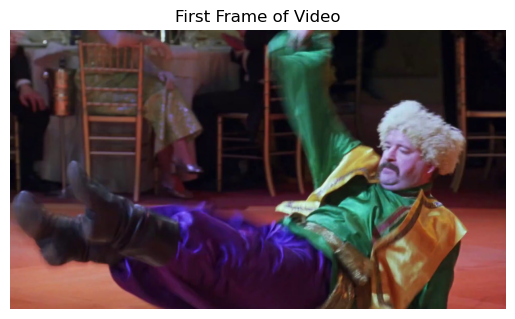

In [118]:
query = query_texts[9]
process_video_from_query(
    query,
    searchvideopicturesom5,
    searchvideopicturesom4,
    search_TextSom1,
    SOM1,
    DOC2VEC_MODEL,
    data_dict1,
    film_features,
    duration=5
)